In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error

from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from catboost import CatBoostRegressor

import lazypredict
from lazypredict.Supervised import LazyRegressor

import phik
from phik.report import plot_correlation_matrix
from phik import report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping

mpl.rcParams['font.size'] = 10
sns.set(style="dark")
colors = sns.color_palette("Set2", 13)


## Разведочный анализ

### Import

In [2]:
df_bp = pd.read_excel('Datasets/X_bp.xlsx', index_col=0)
df_bp.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.86,2030.00,738.74,30.00,22.27,100.00,210.00,70.00,3000.00,220.00
1,1.86,2030.00,738.74,50.00,23.75,284.62,210.00,70.00,3000.00,220.00
2,1.86,2030.00,738.74,49.90,33.00,284.62,210.00,70.00,3000.00,220.00
3,1.86,2030.00,738.74,129.00,21.25,300.00,210.00,70.00,3000.00,220.00
4,2.77,2030.00,753.00,111.86,22.27,284.62,210.00,70.00,3000.00,220.00
5,2.77,2000.00,748.00,111.86,22.27,284.62,210.00,70.00,3000.00,220.00
6,2.57,1910.00,807.00,111.86,22.27,284.62,210.00,70.00,3000.00,220.00
7,2.56,1900.00,535.00,111.86,22.27,284.62,380.00,75.00,1800.00,120.00
8,3.56,1930.00,889.00,129.00,21.25,300.00,380.00,75.00,1800.00,120.00
9,3.53,2100.00,1421.00,129.00,21.25,300.00,1010.00,78.00,2000.00,300.00


In [3]:
df_bp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [4]:
df_bp.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
dtype: int64

In [5]:
df_bp = df_bp.iloc[23:,]
df_bp.reset_index(drop=True, inplace=True)
df_bp.head(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,2.59,1953.27,1136.60,137.63,22.34,234.72,555.89,80.80,2587.34,246.61
1,2.50,1942.60,901.52,146.25,23.08,351.23,864.73,76.18,3705.67,226.22
2,2.05,2037.63,707.57,101.62,23.15,312.31,547.60,73.82,2624.03,178.20


In [6]:
df_nup = pd.read_excel('Datasets/X_nup.xlsx', index_col=0)
df_nup.head(10)

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.00,57.00
1,0,4.00,60.00
2,0,4.00,70.00
3,0,5.00,47.00
4,0,5.00,57.00
5,0,5.00,60.00
6,0,5.00,70.00
7,0,7.00,47.00
8,0,7.00,57.00
9,0,7.00,60.00


In [7]:
df_nup.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1040 entries, 0 to 1039
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   int64  
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 32.5 KB


In [8]:
df_nup.nunique()

Угол нашивки, град       2
Шаг нашивки           1006
Плотность нашивки     1005
dtype: int64

In [9]:
df_nup = df_nup.iloc[40:,]
df_nup.reset_index(drop=True, inplace=True)
df_nup.head(3)

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,7.86,64.30
1,0,7.40,19.25
2,0,6.68,78.62


In [10]:
df = df_bp.merge(df_nup, left_index=True, right_index=True, how='inner')
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2.59,1953.27,1136.60,137.63,22.34,234.72,555.89,80.80,2587.34,246.61,0,7.86,64.30
1,2.50,1942.60,901.52,146.25,23.08,351.23,864.73,76.18,3705.67,226.22,0,7.40,19.25
2,2.05,2037.63,707.57,101.62,23.15,312.31,547.60,73.82,2624.03,178.20,0,6.68,78.62
3,1.86,2018.22,836.29,135.40,26.44,327.51,150.96,77.21,2473.19,123.34,0,7.53,38.18
4,3.31,1917.91,478.29,105.79,17.87,328.15,526.69,72.35,3059.03,275.58,0,8.33,46.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2.27,1952.09,912.86,86.99,20.12,324.77,209.20,73.09,2387.29,125.01,90,8.09,47.76
996,3.44,2050.09,444.73,145.98,19.60,254.22,350.66,72.92,2360.39,117.73,90,7.62,66.93
997,3.28,1972.37,416.84,110.53,23.96,248.42,740.14,74.73,2662.91,236.61,90,9.80,72.86
998,3.71,2066.80,741.48,141.40,19.25,275.78,641.47,74.04,2071.72,197.13,90,10.08,65.52


### Статистические характеристики

In [11]:
df.nunique()

Соотношение матрица-наполнитель         1000
Плотность, кг/м3                        1000
модуль упругости, ГПа                   1000
Количество отвердителя, м.%             1000
Содержание эпоксидных групп,%_2         1000
Температура вспышки, С_2                1000
Поверхностная плотность, г/м2           1000
Модуль упругости при растяжении, ГПа    1000
Прочность при растяжении, МПа           1000
Потребление смолы, г/м2                 1000
Угол нашивки, град                         2
Шаг нашивки                             1000
Плотность нашивки                       1000
dtype: int64

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1000 non-null   float64
 1   Плотность, кг/м3                      1000 non-null   float64
 2   модуль упругости, ГПа                 1000 non-null   float64
 3   Количество отвердителя, м.%           1000 non-null   float64
 4   Содержание эпоксидных групп,%_2       1000 non-null   float64
 5   Температура вспышки, С_2              1000 non-null   float64
 6   Поверхностная плотность, г/м2         1000 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1000 non-null   float64
 8   Прочность при растяжении, МПа         1000 non-null   float64
 9   Потребление смолы, г/м2               1000 non-null   float64
 10  Угол нашивки, град                    1000 non-null   int64  
 11  Шаг нашивки       

In [13]:
df.isna().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [14]:
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [15]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1000.00,2.93,0.91,0.39,2.32,2.91,3.55,5.59
"Плотность, кг/м3",1000.00,1975.67,73.80,1731.76,1924.20,1977.57,2021.16,2207.77
"модуль упругости, ГПа",1000.00,739.95,330.33,2.44,498.44,741.15,962.85,1911.54
"Количество отвердителя, м.%",1000.00,110.54,28.30,17.74,92.17,110.16,130.31,198.95
"Содержание эпоксидных групп,%_2",1000.00,22.24,2.41,14.25,20.56,22.23,23.98,28.96
"Температура вспышки, С_2",1000.00,285.91,40.96,160.26,258.54,285.85,313.58,413.27
"Поверхностная плотность, г/м2",1000.00,483.02,280.81,0.60,268.06,452.97,694.21,1399.54
"Модуль упругости при растяжении, ГПа",1000.00,73.33,3.12,64.05,71.30,73.25,75.38,82.68
"Прочность при растяжении, МПа",1000.00,2467.18,485.62,1036.86,2143.83,2461.25,2760.16,3848.44
"Потребление смолы, г/м2",1000.00,218.39,59.82,33.80,179.19,217.28,257.50,414.59


### Обработка категориальных признаков

In [16]:
df['Угол нашивки, град'].value_counts()

Угол нашивки, град
0     500
90    500
Name: count, dtype: int64

In [17]:
labelencoder = LabelEncoder()
df['Угол нашивки, град'] = labelencoder.fit_transform(df['Угол нашивки, град'])
df['Угол нашивки, град'].value_counts()


Угол нашивки, град
0    500
1    500
Name: count, dtype: int64

### Описательная статистика

In [18]:
# Распределение по параметру 'Угол нашивки, град' не требует дополнительной визуализации, уберем для более аккуратной визуализации
visual_col = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       # 'Угол нашивки, град', 
       'Шаг нашивки', 'Плотность нашивки']

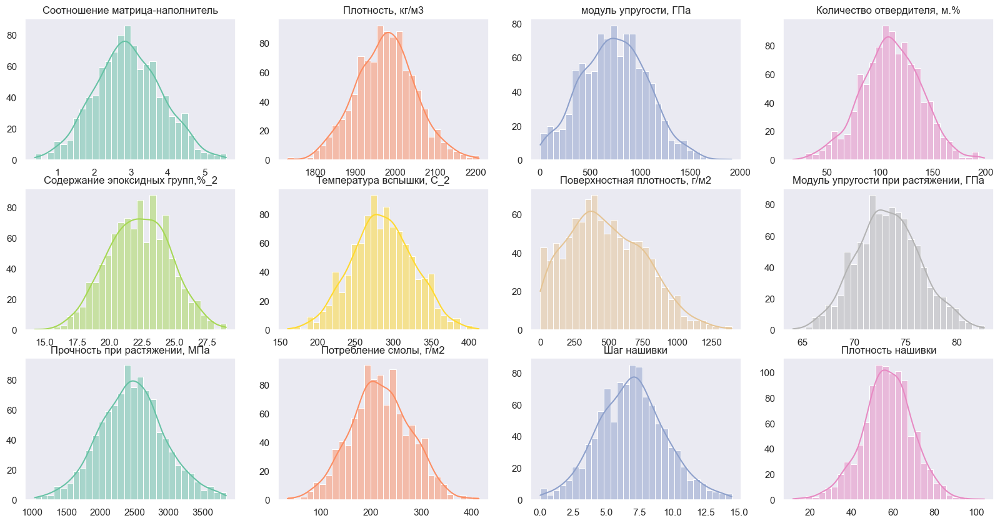

In [19]:
plt.figure(figsize=(20,10))

for i, column in enumerate(visual_col):
    n = i + 1
    plt.subplot(3, 4, n)
    sns.histplot(data=df, x=column, kde=True, bins=30, color=colors[i]).set(xlabel=None, ylabel=None)
    plt.title(column)


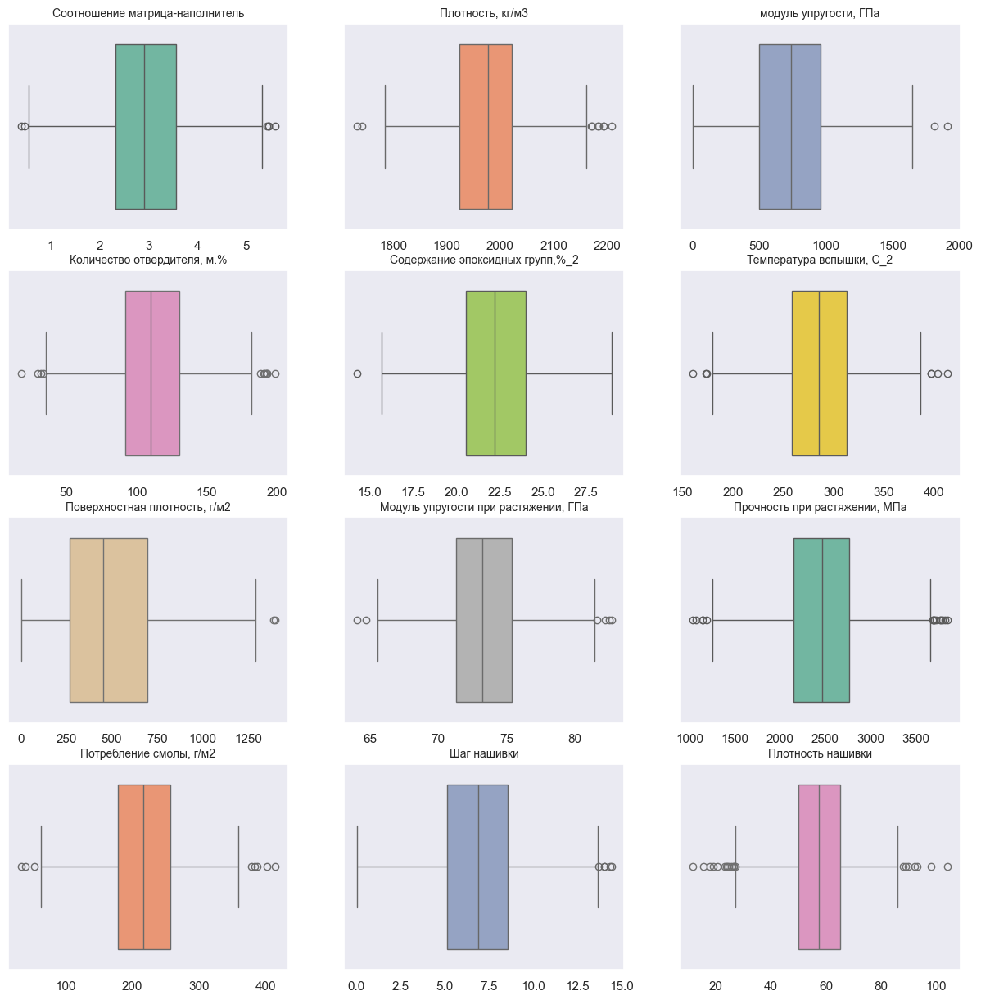

In [20]:
plt.figure(figsize=(15,15))

for i, column in enumerate(visual_col):
    n = i + 1
    plt.subplot(4, 3, n)
    sns.boxplot(data=df, x=column, color=colors[i]).set(xlabel=None)
    plt.title(column, size = 10)

Text(0.5, 1.0, 'Корреляция признаков композитных материалов')

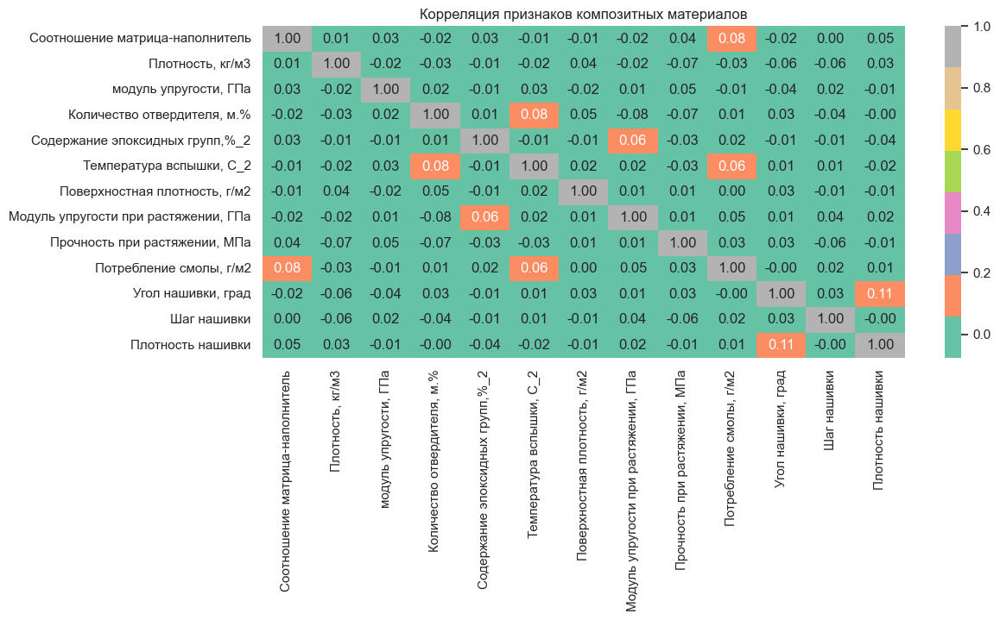

In [21]:
plt.figure(figsize=(12,5))
sns.heatmap(df.corr(), cmap='Set2', annot=True, fmt='.2f').set_title('Корреляция признаков композитных материалов')


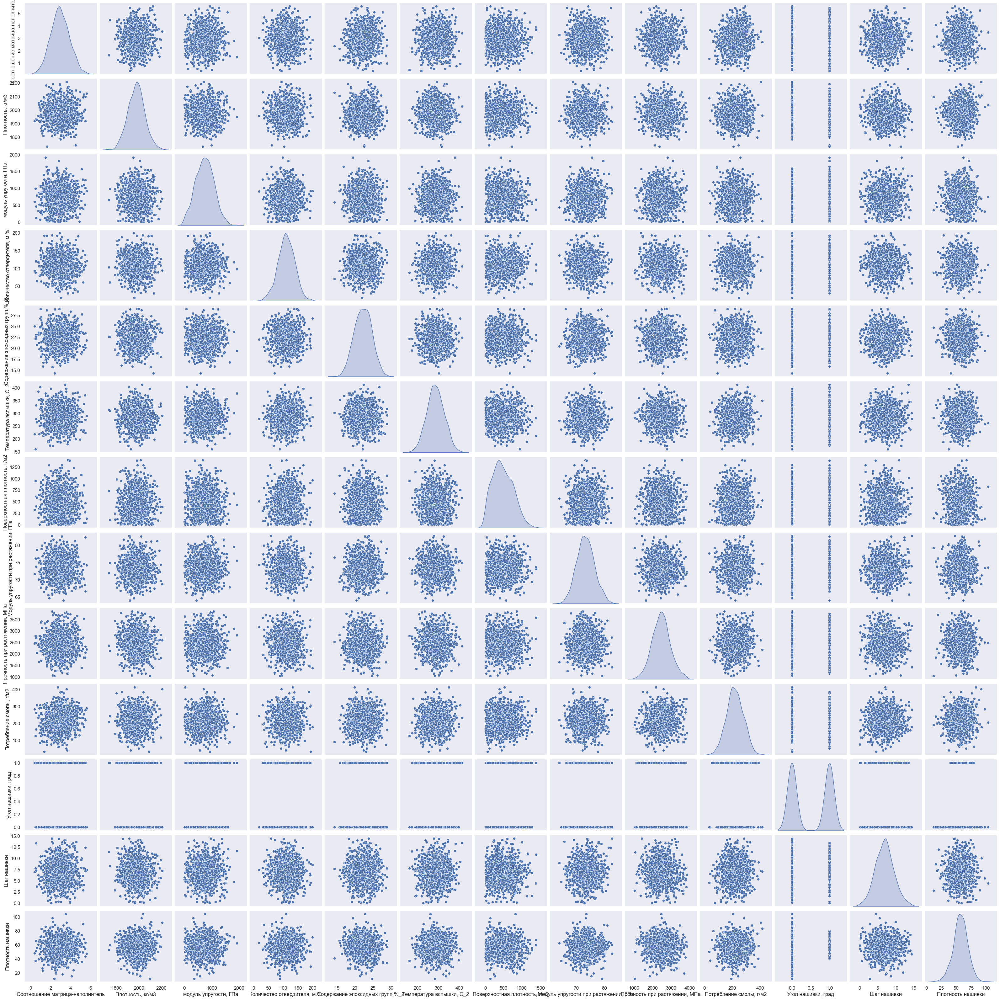

In [22]:
sns.pairplot(df, diag_kind='kde')

#### Phik

In [23]:
phik_overview = df.phik_matrix()
phik_overview['Модуль упругости при растяжении, ГПа'].sort_values(ascending=False)

interval columns not set, guessing: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']


Модуль упругости при растяжении, ГПа   1.00
Шаг нашивки                            0.26
модуль упругости, ГПа                  0.17
Потребление смолы, г/м2                0.15
Прочность при растяжении, МПа          0.15
Угол нашивки, град                     0.08
Соотношение матрица-наполнитель        0.00
Плотность, кг/м3                       0.00
Количество отвердителя, м.%            0.00
Содержание эпоксидных групп,%_2        0.00
Температура вспышки, С_2               0.00
Поверхностная плотность, г/м2          0.00
Плотность нашивки                      0.00
Name: Модуль упругости при растяжении, ГПа, dtype: float64

In [24]:
phik_overview['Прочность при растяжении, МПа'].sort_values(ascending=False)

Прочность при растяжении, МПа          1.00
Количество отвердителя, м.%            0.22
Модуль упругости при растяжении, ГПа   0.15
Соотношение матрица-наполнитель        0.10
Потребление смолы, г/м2                0.10
Поверхностная плотность, г/м2          0.08
Плотность нашивки                      0.08
Плотность, кг/м3                       0.00
модуль упругости, ГПа                  0.00
Содержание эпоксидных групп,%_2        0.00
Температура вспышки, С_2               0.00
Угол нашивки, град                     0.00
Шаг нашивки                            0.00
Name: Прочность при растяжении, МПа, dtype: float64

In [25]:
phik_overview['Соотношение матрица-наполнитель'].sort_values(ascending=False)

Соотношение матрица-наполнитель        1.00
Температура вспышки, С_2               0.13
Прочность при растяжении, МПа          0.10
Потребление смолы, г/м2                0.10
Плотность, кг/м3                       0.06
Шаг нашивки                            0.04
модуль упругости, ГПа                  0.00
Количество отвердителя, м.%            0.00
Содержание эпоксидных групп,%_2        0.00
Поверхностная плотность, г/м2          0.00
Модуль упругости при растяжении, ГПа   0.00
Угол нашивки, град                     0.00
Плотность нашивки                      0.00
Name: Соотношение матрица-наполнитель, dtype: float64

In [26]:
X_col_uprug = ['модуль упругости, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки']

X_col_proch = ['Количество отвердителя, м.%',
       'Модуль упругости при растяжении, ГПа',
       'Соотношение матрица-наполнитель', 'Потребление смолы, г/м2',
       'Поверхностная плотность, г/м2', ]

X_col_matrix = ['Температура вспышки, С_2', 
                'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 
                'Плотность, кг/м3', 'Шаг нашивки']


### Разобьем датасет на обучающий и тестовый

In [27]:
df_train, df_test = train_test_split(df,  test_size=0.3, random_state=42)
df_train.shape, df_test.shape

((700, 13), (300, 13))

### Работа с выбросами

In [28]:
def out_quartile(df, method:str='quartile'):
    methods = ['quartile', 'sigm']
    if method not in methods:
        return f'Wrong method. Availible methods: {methods}'
    
    if method == 'quartile':
         
        for col in df:
            q25, q75 = df[col].quantile(0.25), df[col].quantile(0.75)
            iqr = q75 - q25 # межквартильный размах
            
            upper_bound = q75 + (1.5 * iqr)
            lower_bound = q25 - (1.5 * iqr)
            
            df[df[col] <= lower_bound] = np.nan
            df[df[col] >= upper_bound] = np.nan

        df = df.dropna(axis = 0)

    elif method == 'sigm':
        for col in df:
            df = df[abs((df_train[col] - df[col].mean()) / df[col].std()) < 3]

    return df


In [29]:
df_train = out_quartile(df_train, method='quartile')

In [30]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 642 entries, 541 to 102
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       642 non-null    float64
 1   Плотность, кг/м3                      642 non-null    float64
 2   модуль упругости, ГПа                 642 non-null    float64
 3   Количество отвердителя, м.%           642 non-null    float64
 4   Содержание эпоксидных групп,%_2       642 non-null    float64
 5   Температура вспышки, С_2              642 non-null    float64
 6   Поверхностная плотность, г/м2         642 non-null    float64
 7   Модуль упругости при растяжении, ГПа  642 non-null    float64
 8   Прочность при растяжении, МПа         642 non-null    float64
 9   Потребление смолы, г/м2               642 non-null    float64
 10  Угол нашивки, град                    642 non-null    float64
 11  Шаг нашивки           

In [31]:
df_train.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,642.00,2.93,0.89,0.55,2.34,2.93,3.51,5.31
"Плотность, кг/м3",642.00,1975.43,69.54,1784.48,1926.51,1977.64,2020.97,2160.75
"модуль упругости, ГПа",642.00,731.33,331.57,2.44,483.81,718.72,963.01,1649.42
"Количество отвердителя, м.%",642.00,112.08,27.19,40.30,93.24,112.27,130.90,181.83
"Содержание эпоксидных групп,%_2",642.00,22.26,2.37,15.70,20.62,22.25,23.94,28.91
"Температура вспышки, С_2",642.00,284.86,41.44,173.97,255.88,284.19,313.83,396.90
"Поверхностная плотность, г/м2",642.00,483.27,276.65,0.60,273.01,445.76,696.08,1291.34
"Модуль упругости при растяжении, ГПа",642.00,73.24,3.00,65.55,71.23,73.13,75.21,81.05
"Прочность при растяжении, МПа",642.00,2447.10,458.95,1250.39,2136.15,2440.11,2739.14,3656.16
"Потребление смолы, г/м2",642.00,216.28,57.70,63.69,177.75,215.65,256.19,356.93


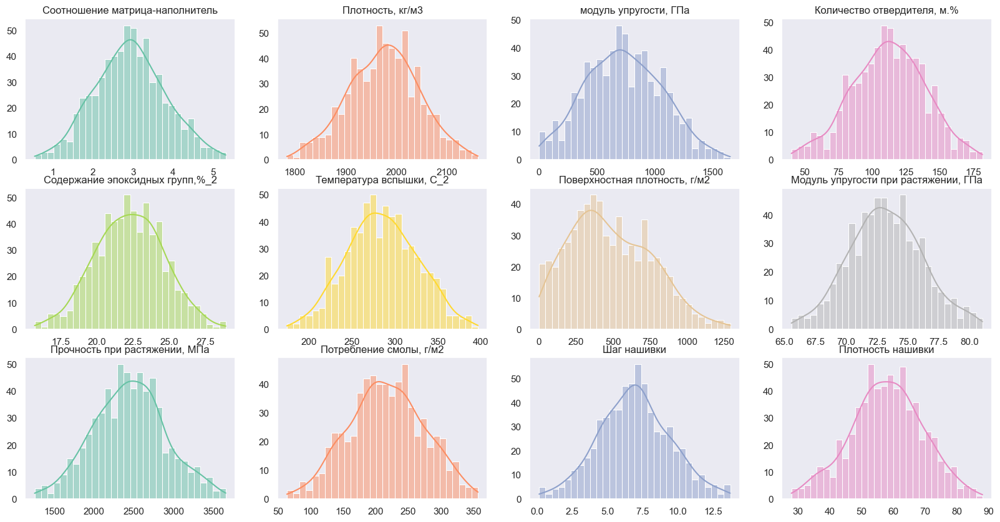

In [32]:
plt.figure(figsize=(20,10))

for i, column in enumerate(visual_col):
    n = i + 1
    plt.subplot(3, 4, n)
    sns.histplot(data=df_train, x=column, kde=True, bins=30, color=colors[i]).set(xlabel=None, ylabel=None)
    plt.title(column)

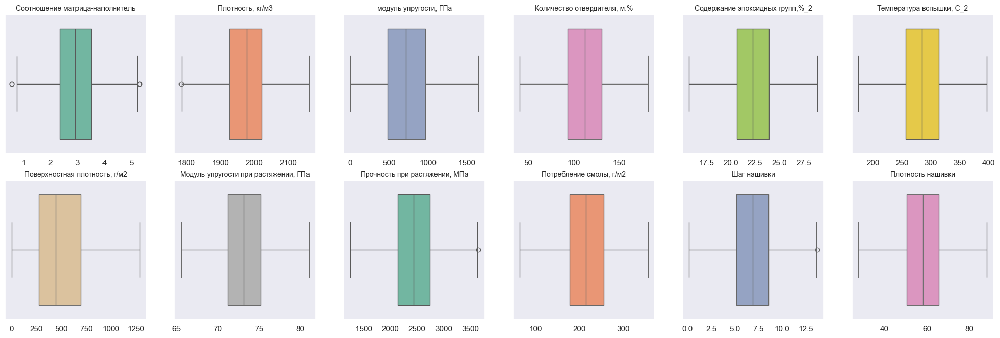

In [33]:
plt.figure(figsize=(25,12))

for i, column in enumerate(visual_col):
    n = i + 1
    plt.subplot(3, 6, n)
    sns.boxplot(data=df_train, x=column, color=colors[i]).set(xlabel=None)
    plt.title(column, size = 10)

Text(0.5, 1.0, 'Корреляция признаков композитных материалов')

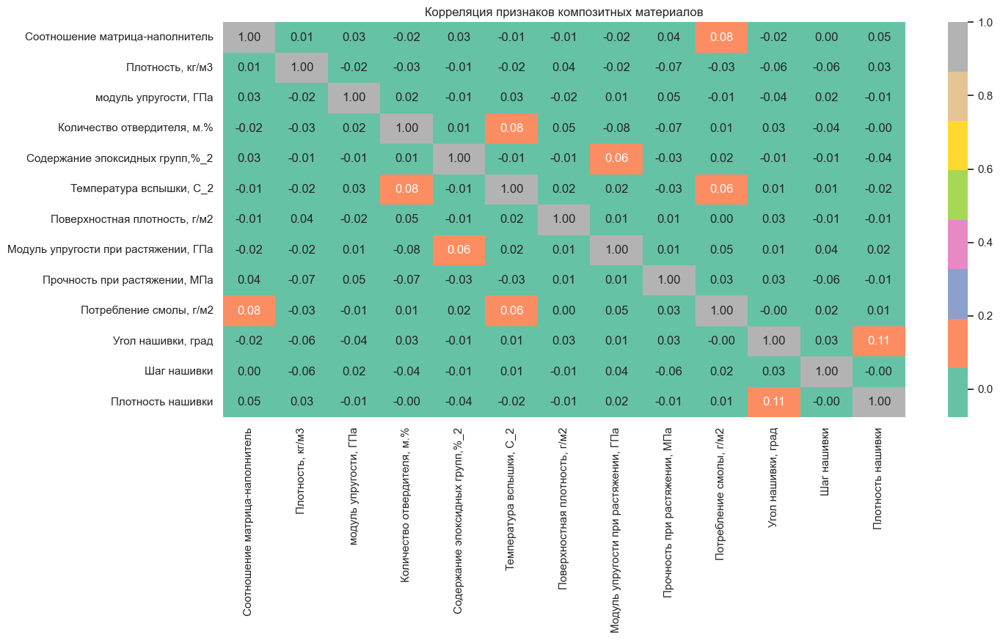

In [34]:
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(), cmap='Set2', annot=True, fmt='.2f').set_title('Корреляция признаков композитных материалов')

## Подготовка датасетов и обучение моделей для прогнозирования Модуля упругости при растяжении и Прочности при растяжении

In [35]:
y_col = 'Модуль упругости при растяжении, ГПа'
y_train_upr = df_train[y_col].copy()
y_test_upr = df_test[y_col].copy()

X_train_upr = df_train.drop([y_col], axis=1)
X_test_upr = df_test.drop([y_col], axis=1)

In [36]:
y_col = 'Прочность при растяжении, МПа'
y_train_proch = df_train[y_col].copy()
y_test_proch = df_test[y_col].copy()

X_train_proch = df_train.drop([y_col], axis=1)
X_test_proch = df_test.drop([y_col], axis=1)


### Нормирование данных

In [37]:
def scaler_train(df_train, scaler='std'):
    scaler_list = ['std', 'mm']
    if scaler not in scaler_list:
        print('Use scaler "std" for StandardScaler or "mm" for MinMaxScaler')
    else:
        if scaler == 'std':
            scaler = StandardScaler()
        else:
            scaler = MinMaxScaler()
        dataset = scaler.fit_transform(np.array(df_train))
        df_scaled = pd.DataFrame(data = dataset, columns = df_train.columns)
    return df_scaled, scaler

def scaler_test(df_test, scaler):
    dataset = scaler.transform(np.array(df_test))
    df_scaled = pd.DataFrame(data = dataset, columns = df_test.columns)
    return df_scaled

In [38]:
X_train_upr, scaler_upr = scaler_train(X_train_upr, scaler='mm')
X_test_upr = scaler_test(X_test_upr, scaler_upr) 

X_train_proch, scaler_proch = scaler_train(X_train_proch, scaler='mm')
X_test_proch = scaler_test(X_test_proch, scaler_proch) 


In [39]:
X_train_upr.shape, X_test_upr.shape, y_train_upr.shape, y_test_upr.shape  

((642, 12), (300, 12), (642,), (300,))

In [40]:
X_train_proch.shape, X_test_proch.shape, y_train_proch.shape, y_test_proch.shape

((642, 12), (300, 12), (642,), (300,))

In [41]:
X_train_upr.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,642.00,0.50,0.19,0.00,0.38,0.50,0.62,1.00
"Плотность, кг/м3",642.00,0.51,0.18,0.00,0.38,0.51,0.63,1.00
"модуль упругости, ГПа",642.00,0.44,0.20,0.00,0.29,0.43,0.58,1.00
"Количество отвердителя, м.%",642.00,0.51,0.19,0.00,0.37,0.51,0.64,1.00
"Содержание эпоксидных групп,%_2",642.00,0.50,0.18,0.00,0.37,0.50,0.62,1.00
"Температура вспышки, С_2",642.00,0.50,0.19,0.00,0.37,0.49,0.63,1.00
"Поверхностная плотность, г/м2",642.00,0.37,0.21,0.00,0.21,0.34,0.54,1.00
"Прочность при растяжении, МПа",642.00,0.50,0.19,0.00,0.37,0.49,0.62,1.00
"Потребление смолы, г/м2",642.00,0.52,0.20,0.00,0.39,0.52,0.66,1.00
"Угол нашивки, град",642.00,0.52,0.50,0.00,0.00,1.00,1.00,1.00


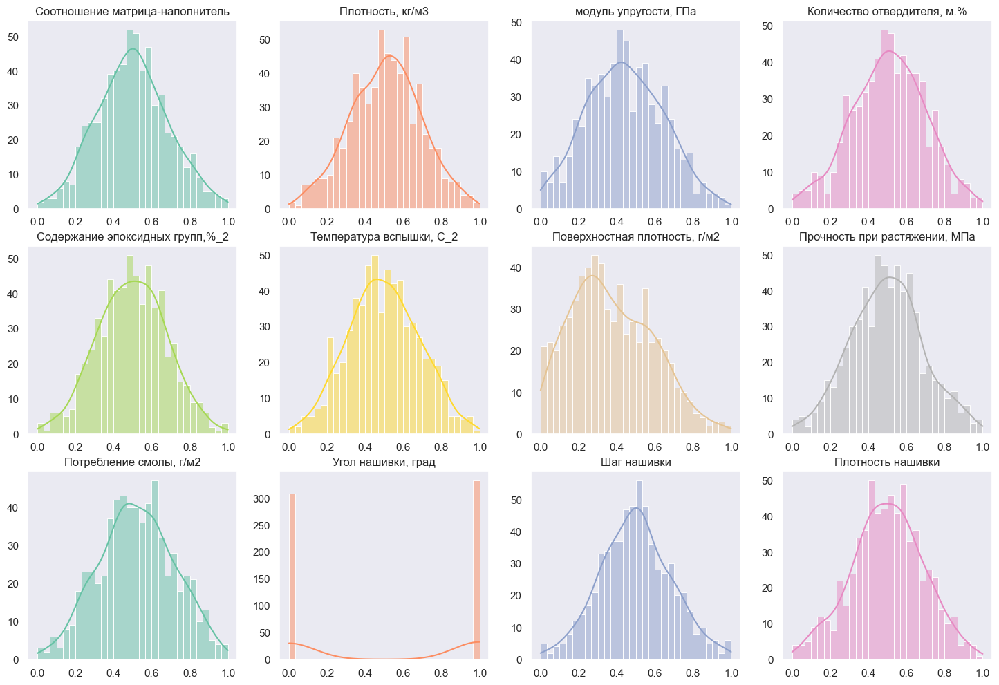

In [42]:
plt.figure(figsize=(18,12))

for i, column in enumerate(X_train_upr.columns):
    n = i + 1
    plt.subplot(3, 4, n)
    sns.histplot(data=X_train_upr, x=column, kde=True, bins=30, color=colors[i]).set(xlabel=None, ylabel=None)
    plt.title(column)

<Axes: >

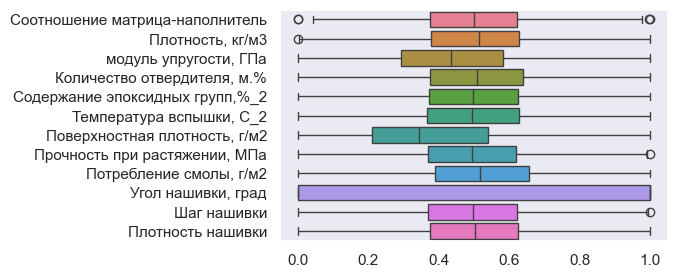

In [43]:
plt.figure(figsize=(5,3))
sns.boxplot(data=X_train_upr, orient='y') 

In [44]:
X_train_proch.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,642.00,0.50,0.19,0.00,0.38,0.50,0.62,1.00
"Плотность, кг/м3",642.00,0.51,0.18,0.00,0.38,0.51,0.63,1.00
"модуль упругости, ГПа",642.00,0.44,0.20,0.00,0.29,0.43,0.58,1.00
"Количество отвердителя, м.%",642.00,0.51,0.19,0.00,0.37,0.51,0.64,1.00
"Содержание эпоксидных групп,%_2",642.00,0.50,0.18,0.00,0.37,0.50,0.62,1.00
"Температура вспышки, С_2",642.00,0.50,0.19,0.00,0.37,0.49,0.63,1.00
"Поверхностная плотность, г/м2",642.00,0.37,0.21,0.00,0.21,0.34,0.54,1.00
"Модуль упругости при растяжении, ГПа",642.00,0.50,0.19,0.00,0.37,0.49,0.62,1.00
"Потребление смолы, г/м2",642.00,0.52,0.20,0.00,0.39,0.52,0.66,1.00
"Угол нашивки, град",642.00,0.52,0.50,0.00,0.00,1.00,1.00,1.00


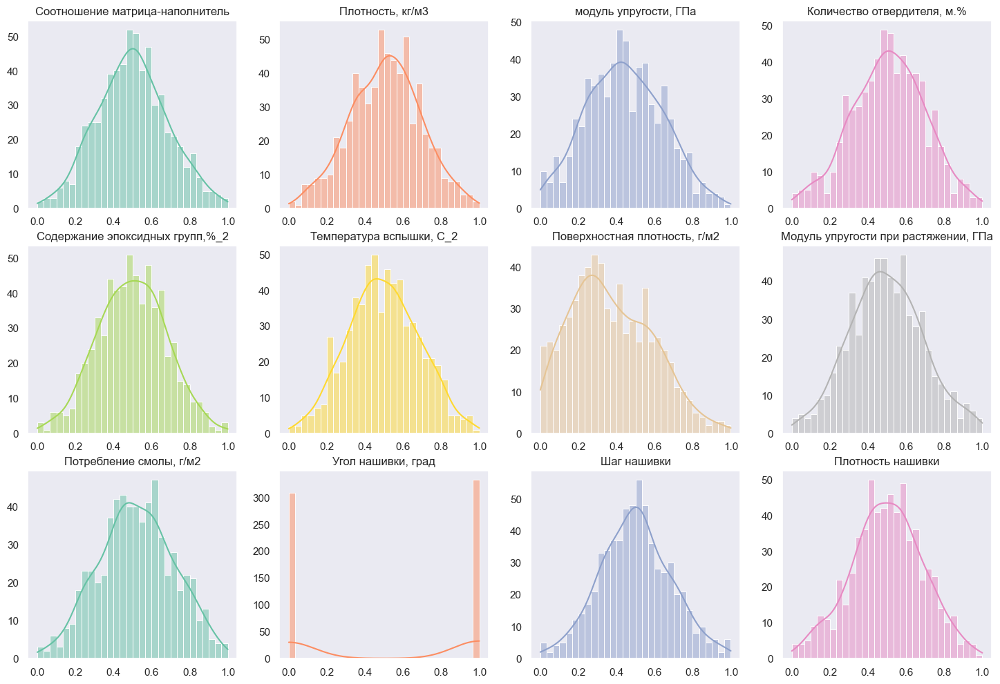

In [45]:
plt.figure(figsize=(18,12))

for i, column in enumerate(X_train_proch.columns):
    n = i + 1
    plt.subplot(3, 4, n)
    sns.histplot(data=X_train_proch, x=column, kde=True, bins=30, color=colors[i]).set(xlabel=None, ylabel=None)
    plt.title(column)

<Axes: >

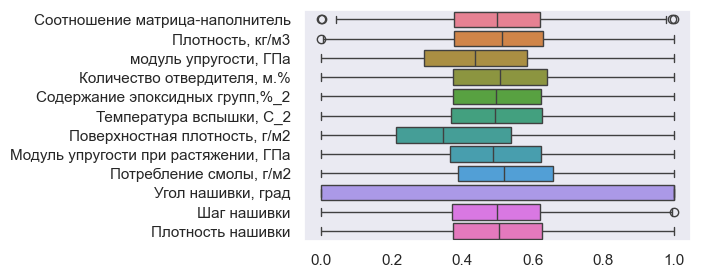

In [46]:
plt.figure(figsize=(5,3))
sns.boxplot(data=X_train_proch, orient='y') 

### Выбор модели регрессии

In [211]:
def modeling(X_train, X_test, y_train, y_test, models:dict=None):
    if models == None:
        models = {
        "lin_reg": LinearRegression(),
        "random_forest_reg": RandomForestRegressor(), 
        "knn_reg": KNeighborsRegressor(),
        "bag_reg": BaggingRegressor(),
        "gb_reg": GradientBoostingRegressor(),
        "cat_reg": CatBoostRegressor(verbose=500, random_seed=42)
        }
    
    mse = {}
    rmse = {}
    mae = {}
    r2 = {}
    r2_train = {}
    mape = {}
    feature_importance = {}
    y_pred = {}

    for model_name, model in models.items():
        
        model.fit(X_train, y_train)
        y_pred[model_name] = model.predict(X_test)

        mse[model_name] = mean_squared_error(y_test, y_pred[model_name])
        rmse[model_name] = np.sqrt(mse[model_name])
        mae[model_name] = mean_absolute_error(y_test, y_pred[model_name])
        r2_train[model_name] = model.score(X_train, y_train)
        r2[model_name] = r2_score(y_test, y_pred[model_name])
        mape[model_name] = mean_absolute_percentage_error(y_test, y_pred[model_name])
        try:
            feature_importance[model_name] = model.feature_importances_
        except:
            pass
    
    metrics = pd.DataFrame({
        "R2_train": pd.Series(r2_train),
        "R2": pd.Series(r2),
        "MSE": pd.Series(mse),
        "RMSE": pd.Series(rmse),
        "MAE": pd.Series(mae),
        "MAPE": pd.Series(mape),
        
        
    })
    return models, metrics, y_pred, feature_importance


In [48]:
cols_upr = [
    'Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Прочность при растяжении, МПа',
       'Потребление смолы, г/м2', 'Угол нашивки, град', 'Шаг нашивки',
       'Плотность нашивки', 

       ]

In [49]:

cols_proch = [
    'Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Потребление смолы, г/м2', 'Угол нашивки, град', 'Шаг нашивки',
       'Плотность нашивки', 

       ]

##### 3 сигма результаты моделей


In [ ]:
# # Результат на 3 сигма
# models_upr, metrics_upr, y_pred_upr, features = modeling(X_train_upr[cols_upr], X_test_upr[cols_upr], y_train_upr, y_test_upr)
# metrics_upr

Learning rate set to 0.038567
0:	learn: 3.0444263	total: 9.21ms	remaining: 9.2s
500:	learn: 1.3032253	total: 3.37s	remaining: 3.35s
999:	learn: 0.6533941	total: 6.3s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.01,0.01,10.55,3.25,2.66,0.04
random_forest_reg,0.85,-0.08,11.50,3.39,2.77,0.04
knn_reg,0.23,-0.23,13.01,3.61,2.97,0.04
bag_reg,0.80,-0.17,12.43,3.53,2.83,0.04
gb_reg,0.54,-0.09,11.60,3.41,2.77,0.04
cat_reg,0.95,-0.22,12.98,3.60,2.92,0.04


In [ ]:
# # Результат на 3 сигма
# cols_upr = [
#     'Соотношение матрица-наполнитель', 'Плотность, кг/м3',
#        'модуль упругости, ГПа', 'Количество отвердителя, м.%',
#        'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
#        'Поверхностная плотность, г/м2', 'Прочность при растяжении, МПа',
#        'Потребление смолы, г/м2', 
#     #    'Угол нашивки, град', 
#        'Шаг нашивки',
#        'Плотность нашивки', 
#        ]
# models_upr, metrics_upr, y_pred_upr, features = modeling(X_train_upr[cols_upr], X_test_upr[cols_upr], y_train_upr, y_test_upr)
# metrics_upr

Learning rate set to 0.038567
0:	learn: 3.0440556	total: 10.5ms	remaining: 10.5s
500:	learn: 1.3795616	total: 2.94s	remaining: 2.93s
999:	learn: 0.6849772	total: 6.09s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.01,0.01,10.53,3.24,2.65,0.04
random_forest_reg,0.85,-0.08,11.47,3.39,2.77,0.04
knn_reg,0.24,-0.20,12.78,3.57,2.93,0.04
bag_reg,0.79,-0.18,12.55,3.54,2.86,0.04
gb_reg,0.54,-0.11,11.77,3.43,2.79,0.04
cat_reg,0.95,-0.22,12.95,3.60,2.91,0.04


In [ ]:
# # Результат на 3 сигма
# models_proch, metrics_proch, y_pred_proch, features = modeling(X_train_proch[cols_proch], X_test_proch[cols_proch], y_train_proch, y_test_proch)
# metrics_proch

Learning rate set to 0.038567
0:	learn: 484.3762983	total: 5.57ms	remaining: 5.56s
500:	learn: 215.5719202	total: 4.85s	remaining: 4.83s
999:	learn: 103.5270278	total: 7.89s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.03,-0.03,229413.71,478.97,380.91,0.16
random_forest_reg,0.86,-0.06,236789.40,486.61,385.13,0.17
knn_reg,0.21,-0.26,280934.26,530.03,425.38,0.18
bag_reg,0.81,-0.12,250708.49,500.71,388.62,0.17
gb_reg,0.54,-0.14,254115.08,504.10,402.27,0.17
cat_reg,0.95,-0.13,252811.93,502.80,397.67,0.17


In [ ]:
# # Результат на 3 сигма
# cols_proch = [
#     'Соотношение матрица-наполнитель', 'Плотность, кг/м3',
#        'модуль упругости, ГПа', 'Количество отвердителя, м.%',
#        'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
#        'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
#        'Потребление смолы, г/м2', 
#     #    'Угол нашивки, град', 
#        'Шаг нашивки',
#        'Плотность нашивки', 

#        ]
# models_proch, metrics_proch, y_pred_proch, features = modeling(X_train_proch[cols_proch], X_test_proch[cols_proch], y_train_proch, y_test_proch)
# metrics_proch

Learning rate set to 0.038567
0:	learn: 484.9663015	total: 12.7ms	remaining: 12.7s
500:	learn: 217.4644137	total: 3.37s	remaining: 3.35s
999:	learn: 109.3824765	total: 6.5s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.03,-0.03,229610.98,479.18,381.07,0.16
random_forest_reg,0.86,-0.02,228296.35,477.80,377.95,0.16
knn_reg,0.23,-0.27,282776.04,531.77,418.13,0.18
bag_reg,0.79,-0.12,248908.60,498.91,394.27,0.17
gb_reg,0.55,-0.12,249049.11,499.05,398.73,0.17
cat_reg,0.95,-0.14,254884.78,504.86,400.95,0.17


In [ ]:
# # Результат на 3 сигма
# models_upr_phik, metrics_upr_phik, y_pred_upr_phik, features_phik = modeling(X_train_upr[cols_upr], X_test_upr[cols_upr], y_train_upr, y_test_upr)
# metrics_upr_phik

Learning rate set to 0.038567
0:	learn: 3.0440799	total: 4.44ms	remaining: 4.44s
500:	learn: 1.8995906	total: 2.09s	remaining: 2.08s
999:	learn: 1.3670238	total: 3.88s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.00,-0.00,10.63,3.26,2.67,0.04
random_forest_reg,0.85,-0.09,11.55,3.40,2.77,0.04
knn_reg,0.22,-0.17,12.38,3.52,2.82,0.04
bag_reg,0.78,-0.12,11.88,3.45,2.78,0.04
gb_reg,0.41,-0.09,11.58,3.40,2.78,0.04
cat_reg,0.80,-0.24,13.14,3.63,2.94,0.04


In [ ]:
# # Результат на 3 сигма
# models_proch_phik, metrics_proch_phik, y_pred_proch_phik, features_phik = modeling(X_train_proch[cols_proch], X_test_proch[cols_proch], y_train_proch, y_test_proch)
# metrics_proch_phik

Learning rate set to 0.038567
0:	learn: 485.3331764	total: 12ms	remaining: 12s
500:	learn: 278.3704431	total: 3.17s	remaining: 3.16s
999:	learn: 176.9434218	total: 5.55s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.01,-0.02,227322.56,476.78,372.29,0.16
random_forest_reg,0.85,-0.08,241315.40,491.24,384.30,0.17
knn_reg,0.23,-0.25,279506.66,528.68,408.69,0.17
bag_reg,0.79,-0.18,262907.09,512.74,412.55,0.18
gb_reg,0.45,-0.12,249276.01,499.28,392.60,0.17
cat_reg,0.87,-0.15,256568.35,506.53,400.86,0.17


#### Модели со всеми параметрами

In [50]:
models_upr, metrics_upr, y_pred_upr, features = modeling(X_train_upr[cols_upr], X_test_upr[cols_upr], y_train_upr, y_test_upr)
metrics_upr

Learning rate set to 0.038174
0:	learn: 2.9897849	total: 139ms	remaining: 2m 19s
500:	learn: 1.2764798	total: 1.87s	remaining: 1.86s
999:	learn: 0.6392663	total: 3.81s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.01,0.00,10.60,3.26,2.67,0.04
random_forest_reg,0.85,-0.09,11.56,3.40,2.79,0.04
knn_reg,0.23,-0.22,12.99,3.60,2.97,0.04
bag_reg,0.80,-0.13,12.03,3.47,2.79,0.04
gb_reg,0.51,-0.16,12.27,3.50,2.83,0.04
cat_reg,0.95,-0.19,12.67,3.56,2.91,0.04


In [51]:
features

{'random_forest_reg': array([0.08841587, 0.08674836, 0.08077523, 0.11800422, 0.09169947,
        0.08909271, 0.0922231 , 0.08214529, 0.08775168, 0.01378721,
        0.08608621, 0.08327065]),
 'gb_reg': array([0.11242303, 0.05492598, 0.08188452, 0.13598223, 0.12815826,
        0.10764148, 0.07220622, 0.07415009, 0.07794193, 0.01343397,
        0.07069705, 0.07055526]),
 'cat_reg': array([ 8.41658111,  7.09940295,  9.31657745, 10.08898888,  9.20814185,
        10.25770188,  8.36057988,  8.20292195,  9.14085331,  4.62562993,
         7.17070234,  8.11191848])}

In [52]:
cols_upr = [
    'Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Прочность при растяжении, МПа',
       'Потребление смолы, г/м2', 
    #    'Угол нашивки, град', 
       'Шаг нашивки',
       'Плотность нашивки', 
       ]
models_upr, metrics_upr, y_pred_upr, features = modeling(X_train_upr[cols_upr], X_test_upr[cols_upr], y_train_upr, y_test_upr)
metrics_upr

Learning rate set to 0.038174
0:	learn: 2.9889258	total: 2.5ms	remaining: 2.5s
500:	learn: 1.3520951	total: 1.67s	remaining: 1.66s
999:	learn: 0.6384855	total: 4s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.01,0.01,10.55,3.25,2.66,0.04
random_forest_reg,0.86,-0.06,11.21,3.35,2.73,0.04
knn_reg,0.23,-0.19,12.62,3.55,2.91,0.04
bag_reg,0.81,-0.21,12.81,3.58,2.92,0.04
gb_reg,0.52,-0.12,11.93,3.45,2.80,0.04
cat_reg,0.95,-0.16,12.34,3.51,2.86,0.04


In [53]:
models_proch, metrics_proch, y_pred_proch, features = modeling(X_train_proch[cols_proch], X_test_proch[cols_proch], y_train_proch, y_test_proch)
metrics_proch

Learning rate set to 0.038174
0:	learn: 457.3229619	total: 2.43ms	remaining: 2.43s
500:	learn: 205.7858433	total: 1.64s	remaining: 1.63s
999:	learn: 104.2752829	total: 4.02s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.03,-0.02,227283.52,476.74,378.33,0.16
random_forest_reg,0.85,-0.04,231679.27,481.33,383.10,0.16
knn_reg,0.24,-0.19,264446.25,514.24,411.60,0.18
bag_reg,0.81,-0.16,258105.18,508.04,399.94,0.17
gb_reg,0.53,-0.09,243071.51,493.02,394.68,0.17
cat_reg,0.95,-0.09,243875.61,493.84,393.72,0.17


In [54]:
features

{'random_forest_reg': array([0.08196693, 0.1035598 , 0.10541676, 0.10541954, 0.08186712,
        0.09049908, 0.09045086, 0.07906344, 0.07530995, 0.00893344,
        0.09214774, 0.08536534]),
 'gb_reg': array([0.04265098, 0.09189533, 0.11435909, 0.09086089, 0.12393597,
        0.09627308, 0.09564316, 0.07338205, 0.08618349, 0.01482986,
        0.09491413, 0.07507197]),
 'cat_reg': array([ 8.56559069,  9.73707275,  9.09861903,  9.14636361,  7.8070404 ,
        10.47206773,  7.73977566,  9.20375122,  7.2227695 ,  4.25052423,
         8.08087283,  8.67555236])}

In [60]:
cols_proch = [
    'Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Потребление смолы, г/м2', 
    #    'Угол нашивки, град', 
       'Шаг нашивки',
       'Плотность нашивки', 

       ]
models_proch, metrics_proch, y_pred_proch, features = modeling(X_train_proch[cols_proch], X_test_proch[cols_proch], y_train_proch, y_test_proch)
metrics_proch

Learning rate set to 0.038174
0:	learn: 457.5772531	total: 2.37ms	remaining: 2.37s
500:	learn: 202.2747027	total: 1.65s	remaining: 1.64s
999:	learn: 97.9979219	total: 3.97s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.03,-0.02,227733.35,477.21,378.77,0.16
random_forest_reg,0.85,-0.05,233592.55,483.31,383.08,0.16
knn_reg,0.22,-0.21,269976.68,519.59,407.38,0.17
bag_reg,0.82,-0.15,255763.80,505.73,396.91,0.17
gb_reg,0.55,-0.08,240499.90,490.41,391.57,0.17
cat_reg,0.95,-0.13,253076.45,503.07,401.59,0.17


#### Phik

In [61]:
cols_upr = ['модуль упругости, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки']

cols_proch = ['Количество отвердителя, м.%',
       'Модуль упругости при растяжении, ГПа',
       'Соотношение матрица-наполнитель', 'Потребление смолы, г/м2',
       'Поверхностная плотность, г/м2', ]


In [63]:
models_upr_phik, metrics_upr_phik, y_pred_upr_phik, features_phik = modeling(X_train_upr[cols_upr], X_test_upr[cols_upr], y_train_upr, y_test_upr)
metrics_upr_phik

Learning rate set to 0.038174
0:	learn: 2.9916640	total: 2.96ms	remaining: 2.95s
500:	learn: 1.8753902	total: 982ms	remaining: 978ms
999:	learn: 1.2880795	total: 2.3s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.01,-0.00,10.65,3.26,2.68,0.04
random_forest_reg,0.85,-0.08,11.46,3.38,2.75,0.04
knn_reg,0.23,-0.16,12.27,3.50,2.85,0.04
bag_reg,0.79,-0.13,11.95,3.46,2.83,0.04
gb_reg,0.42,-0.11,11.75,3.43,2.80,0.04
cat_reg,0.82,-0.23,13.00,3.61,2.93,0.04


In [64]:
models_proch_phik, metrics_proch_phik, y_pred_proch_phik, features_phik = modeling(X_train_proch[cols_proch], X_test_proch[cols_proch], y_train_proch, y_test_proch)
metrics_proch_phik

Learning rate set to 0.038174
0:	learn: 457.7479570	total: 1.84ms	remaining: 1.84s
500:	learn: 267.1133815	total: 1.05s	remaining: 1.05s
999:	learn: 173.6670346	total: 2.4s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.01,-0.01,226330.27,475.74,371.20,0.16
random_forest_reg,0.84,-0.06,235971.66,485.77,380.53,0.16
knn_reg,0.26,-0.21,269600.81,519.23,398.43,0.17
bag_reg,0.78,-0.12,249817.30,499.82,384.45,0.16
gb_reg,0.45,-0.07,239125.25,489.00,379.67,0.16
cat_reg,0.86,-0.15,255965.80,505.93,402.07,0.17


### Определение главных компонент

In [65]:
def pca_train(X_train, merge:bool=True):
    pca = PCA()
    X_pca = pca.fit_transform(X_train)

    component_names = [f"PC{i + 1}" for i in range(X_pca.shape[1])]
    X_pca = pd.DataFrame(X_pca, columns=component_names)

    loadings = pd.DataFrame(
        pca.components_.T,
        columns=component_names,
        index=X_train.columns,
    )

    print(loadings)
    print(pca.explained_variance_ratio_)
    
    if merge:
        X_train.reset_index(inplace=True)
        X_train = X_train.join(X_pca)

        X_train.index = np.array(X_train['index'])
        X_train.drop('index', axis=1, inplace=True)
        return X_train, pca
    else:
        return X_pca, pca
    
def pca_test(X_test, pca, merge:bool=True):
    X_pca = pca.transform(X_test)

    component_names = [f"PC{i + 1}" for i in range(X_pca.shape[1])]
    X_pca = pd.DataFrame(X_pca, columns=component_names)
    
    if merge:
        X_test.reset_index(inplace=True)
        X_test = X_test.join(X_pca)

        X_test.index = np.array(X_test['index'])
        X_test.drop('index', axis=1, inplace=True)
        return X_test
    else:
        return X_pca

In [206]:
cols_upr = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Прочность при растяжении, МПа',
       'Потребление смолы, г/м2', 'Угол нашивки, град', 'Шаг нашивки',
       'Плотность нашивки']

cols_proch = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Потребление смолы, г/м2', 'Угол нашивки, град', 'Шаг нашивки',
       'Плотность нашивки']

In [67]:
X_train_upr_pca, pca_upr = pca_train(X_train_upr[cols_upr])
X_test_upr_pca = pca_test(X_test_upr[cols_upr], pca_upr)

X_train_proch_pca, pca_proch = pca_train(X_train_proch[cols_proch])
X_test_proch_pca = pca_test(X_test_proch[cols_proch], pca_proch)

                                  PC1   PC2   PC3   PC4   PC5   PC6   PC7  \
Соотношение матрица-наполнитель -0.00 -0.09  0.37  0.30  0.16  0.13 -0.11   
Плотность, кг/м3                 0.03  0.32  0.03 -0.01  0.00  0.45 -0.18   
модуль упругости, ГПа            0.02 -0.11  0.66 -0.26  0.52  0.22  0.17   
Количество отвердителя, м.%     -0.01  0.16  0.40 -0.26 -0.22 -0.50 -0.36   
Содержание эпоксидных групп,%_2 -0.00 -0.07  0.07 -0.04 -0.06  0.01  0.20   
Температура вспышки, С_2         0.01  0.07  0.29 -0.05 -0.14 -0.40  0.14   
Поверхностная плотность, г/м2    0.00  0.87  0.08  0.24  0.07 -0.04  0.31   
Прочность при растяжении, МПа   -0.01 -0.11 -0.22  0.35  0.62 -0.32  0.12   
Потребление смолы, г/м2          0.01 -0.19  0.29  0.71 -0.26 -0.15  0.05   
Угол нашивки, град              -1.00  0.00  0.01 -0.02  0.01  0.01  0.03   
Шаг нашивки                     -0.00 -0.17  0.13  0.00 -0.41  0.28  0.60   
Плотность нашивки               -0.04  0.04  0.12  0.30 -0.08  0.35 -0.51   

#### PC models

In [68]:
cols_upr = ['PC1', 'PC2', 'PC3'          
            ]

models_upr_pca, metrics_upr_pca, y_pred_upr_pca, features = modeling(X_train_upr_pca[cols_upr], X_test_upr_pca[cols_upr], y_train_upr, y_test_upr)
metrics_upr_pca

Learning rate set to 0.038174
0:	learn: 2.9897820	total: 2.14ms	remaining: 2.13s
500:	learn: 2.1382491	total: 1.08s	remaining: 1.07s
999:	learn: 1.6058146	total: 2.72s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.00,-0.01,10.69,3.27,2.68,0.04
random_forest_reg,0.84,-0.10,11.67,3.42,2.80,0.04
knn_reg,0.19,-0.18,12.51,3.54,2.88,0.04
bag_reg,0.79,-0.25,13.23,3.64,2.96,0.04
gb_reg,0.38,-0.09,11.55,3.40,2.83,0.04
cat_reg,0.71,-0.12,11.84,3.44,2.80,0.04


In [69]:
cols_proch = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5']
models_proch_pca, metrics_proch_pca, y_pred_proch_pca, features = modeling(X_train_proch_pca[cols_proch], X_test_proch_pca[cols_proch], y_train_proch, y_test_proch)
metrics_proch_pca

Learning rate set to 0.038174
0:	learn: 457.4889762	total: 4.01ms	remaining: 4.01s
500:	learn: 271.0139145	total: 1.13s	remaining: 1.13s
999:	learn: 177.7557233	total: 2.76s	remaining: 0us


,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.00,-0.01,225211.84,474.56,370.60,0.16
random_forest_reg,0.84,-0.05,234610.96,484.37,389.27,0.16
knn_reg,0.22,-0.19,264390.13,514.19,411.72,0.17
bag_reg,0.78,-0.15,256933.18,506.89,399.73,0.17
gb_reg,0.44,-0.05,233870.69,483.60,382.19,0.16
cat_reg,0.85,-0.12,249722.52,499.72,400.60,0.17


### Визуализация прогноза vs тестовые значения

In [70]:
def comparison_plot(test, predict, title, model_name):    
    plt.figure(figsize=(10,3))
    plt.title(f'{title}: {model_name}')
    plt.plot(test, label='Тестовая выборка', color='grey')
    plt.plot(predict, label='Прогноз', color='orange')
    plt.legend() # loc='best')
    plt.xlabel('Наблюдения')
    plt.show()

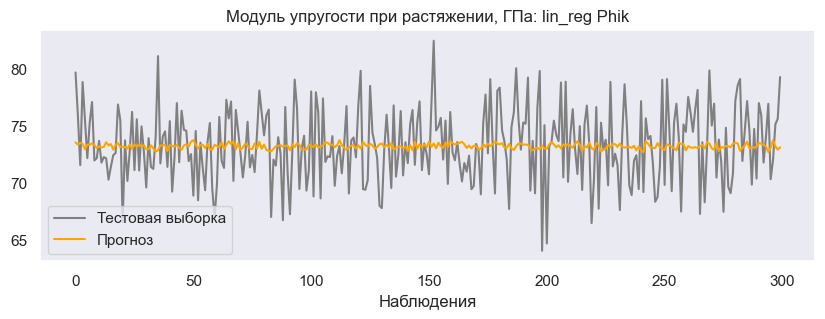

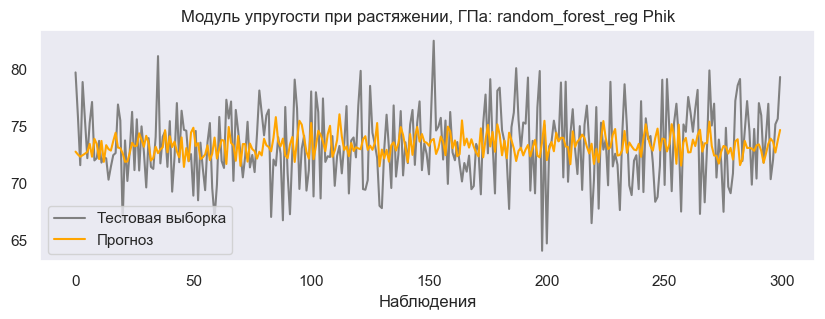

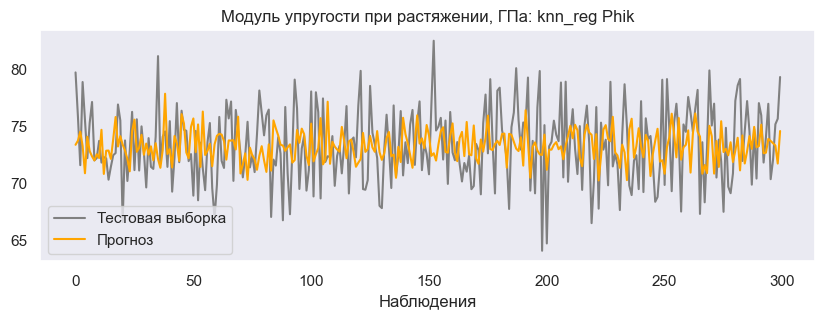

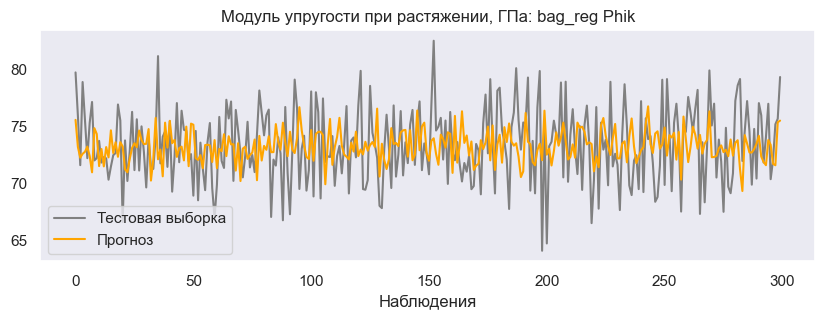

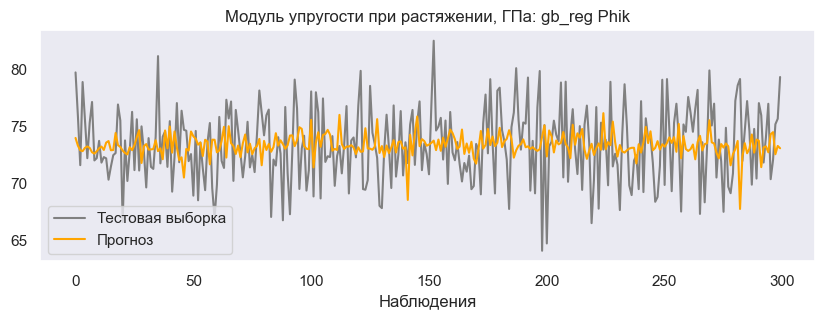

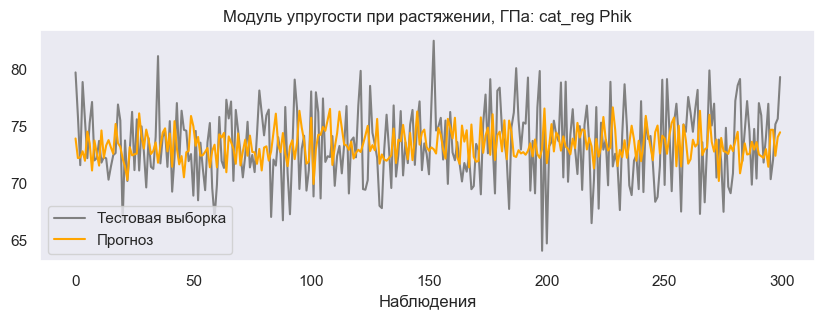

In [71]:
title_1 = 'Модуль упругости при растяжении, ГПа'

for model_name, predict in y_pred_upr_phik.items():
    comparison_plot(y_test_upr.values, predict, title_1, f'{model_name} Phik') 

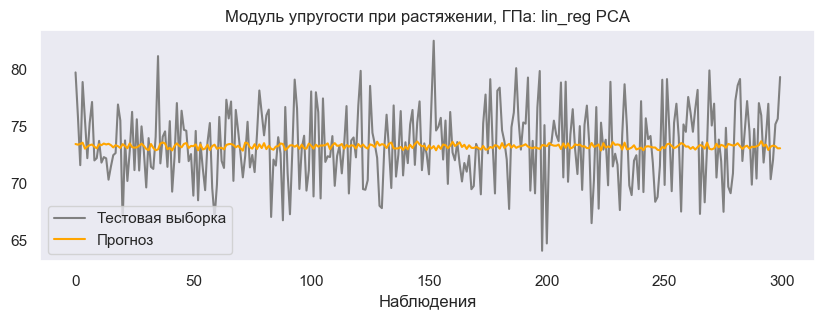

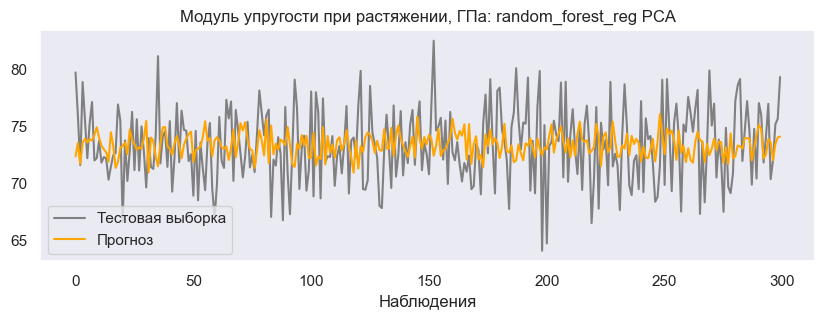

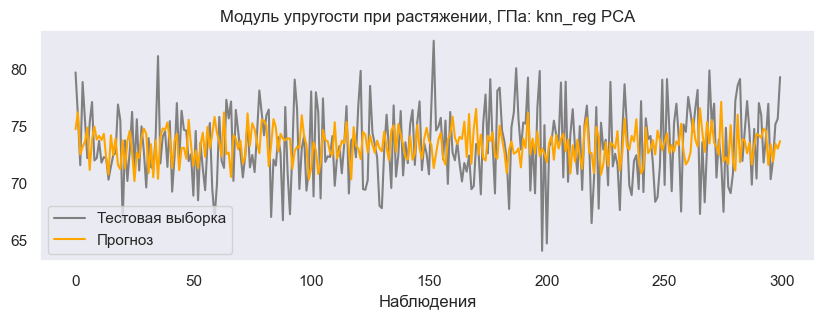

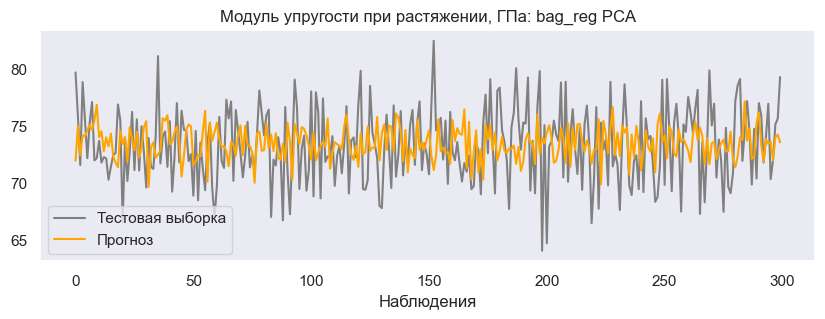

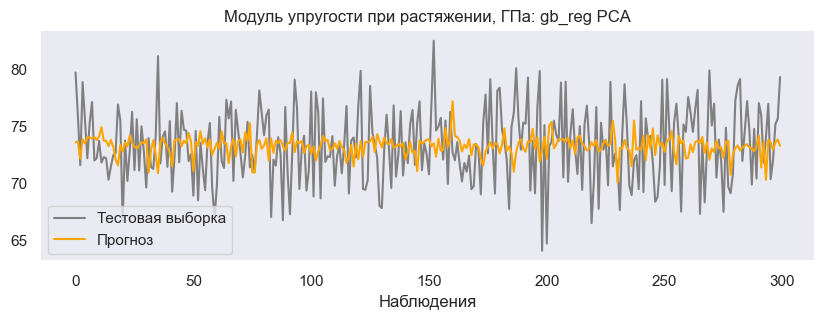

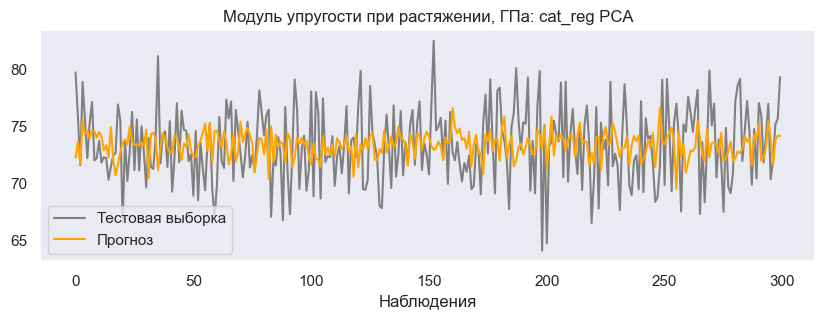

In [72]:
title_1 = 'Модуль упругости при растяжении, ГПа'

for model_name, predict in y_pred_upr_pca.items():
    comparison_plot(y_test_upr.values, predict, title_1, f'{model_name} PCA') 

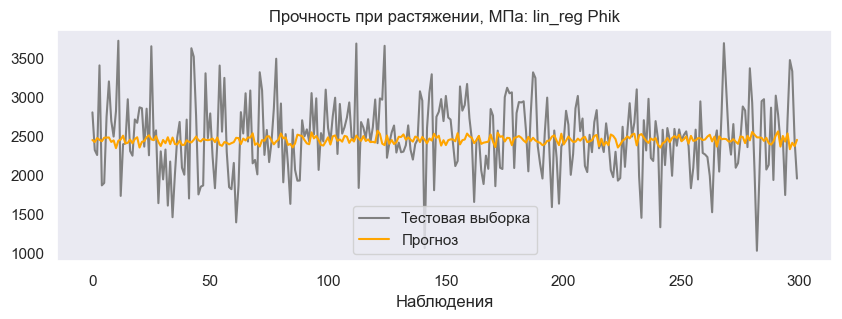

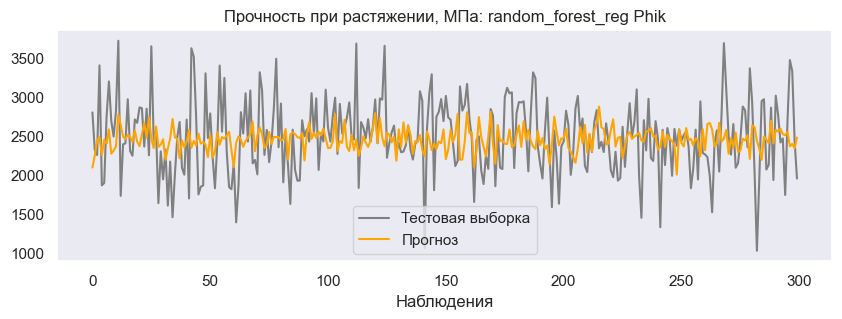

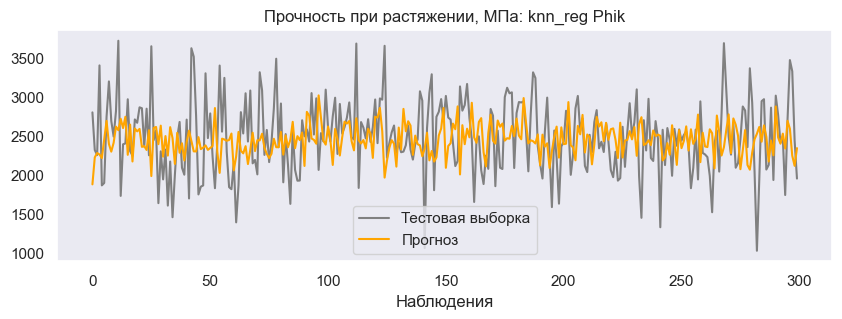

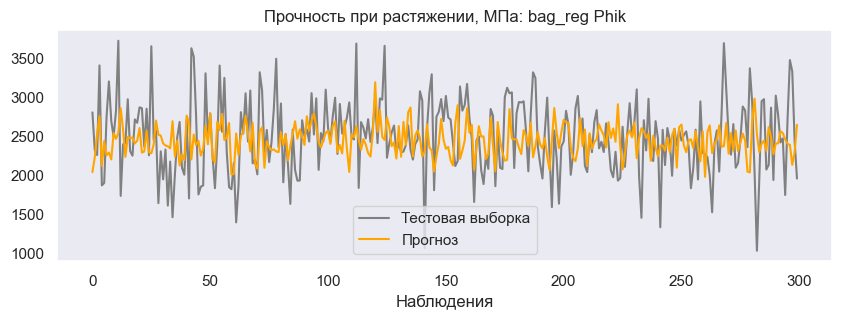

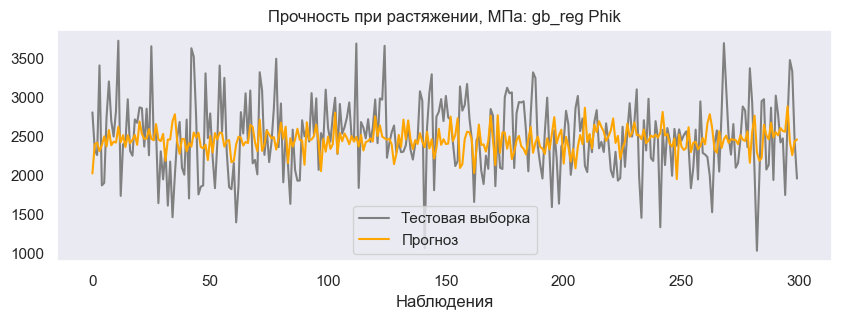

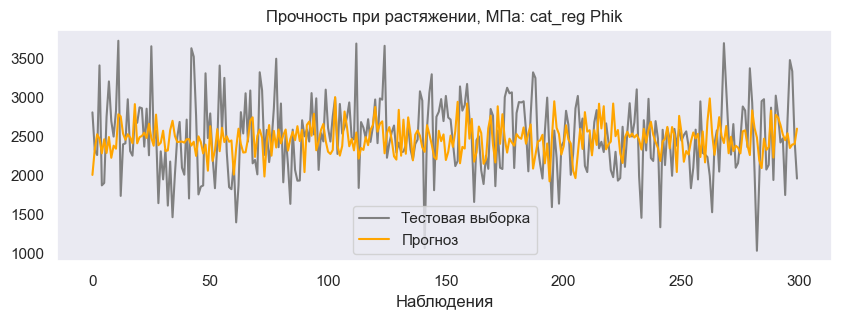

In [73]:
title_2 = 'Прочность при растяжении, МПа'

for model_name, predict in y_pred_proch_phik.items():
    comparison_plot(y_test_proch.values, predict, title_2, f'{model_name} Phik') 
    

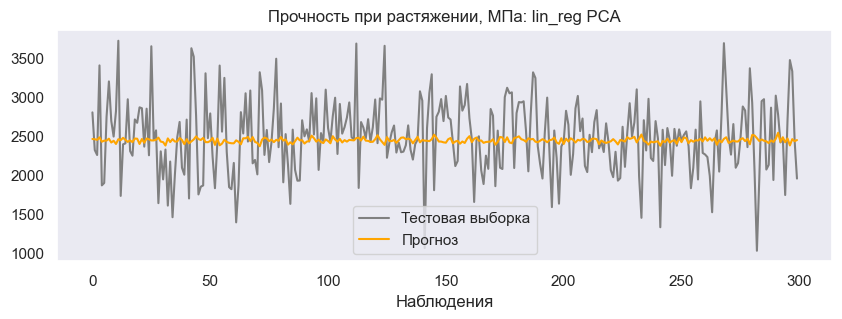

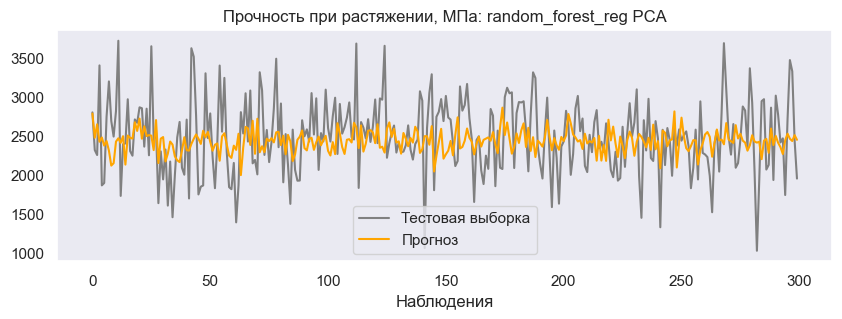

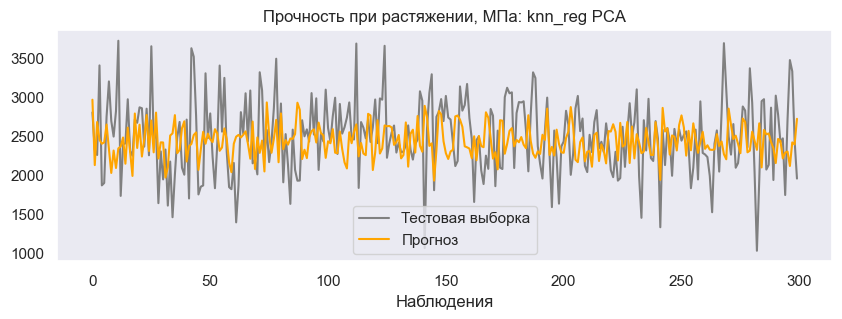

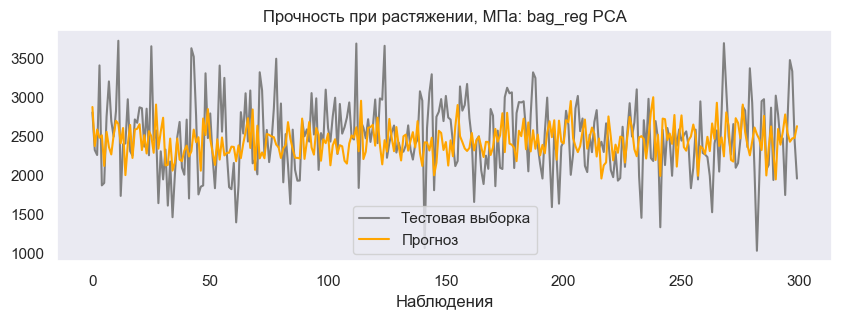

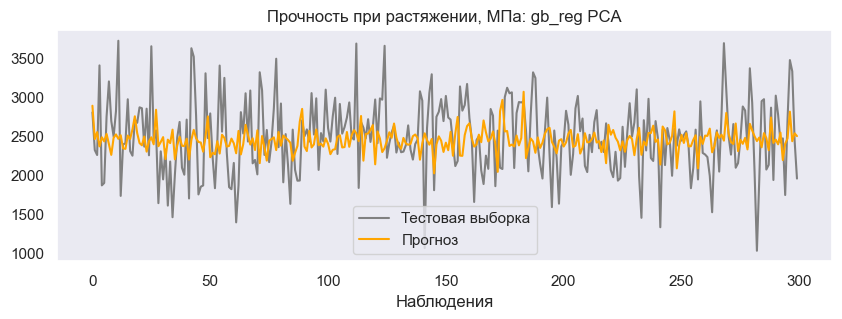

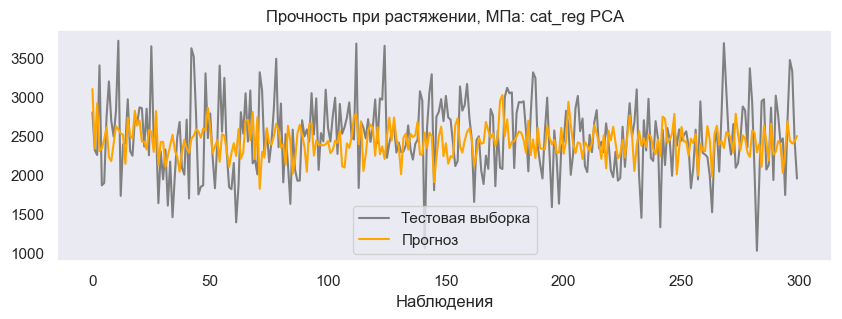

In [74]:
title_2 = 'Прочность при растяжении, МПа'

for model_name, predict in y_pred_proch_pca.items():
    comparison_plot(y_test_proch.values, predict, title_2, f'{model_name} PCA') 

### Подбор гиперпараметров

In [75]:
def hyperparam(X_train, y_train, params):
    models = {
    "lin_reg": LinearRegression(),
    "random_forest_reg": RandomForestRegressor(), 
    "knn_reg": KNeighborsRegressor(),
    "bag_reg": BaggingRegressor(),
    "gb_reg": GradientBoostingRegressor(),
    "cat_reg": CatBoostRegressor(verbose=500, random_seed=42)
    }
    
    best_params = {}
    for model_name, model in models.items():

        model = GridSearchCV(model, params[model_name], cv=10, n_jobs=-1, verbose=0, scoring = 'neg_mean_absolute_error')
        model = model.fit(X_train, y_train)
        best_params[model_name] = model.best_params_
        print(f"Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели {model_name}:  {model.best_params_}")

    return  best_params

In [76]:
models_params = {"lin_reg": {'fit_intercept': [True, False]},
                "random_forest_reg": {'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'],
                                    'n_estimators': range (50, 151, 10),
                                    'min_samples_leaf': range (1, 5),
                                    'min_samples_split': range (2, 10, 2)},
                "knn_reg": {'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                            'n_neighbors': range(1, 101, 10),
                            'weights': ['uniform', 'distance'],
                            'leaf_size': range (10, 51, 10),
                            'metric': ['euclidean', 'cosine', 'manhattan', 'l2', 'minkowski']},
                "bag_reg": {'estimator': [LinearRegression(), RandomForestRegressor(), KNeighborsRegressor()],
                            'max_features': range (1, 5)},
                "gb_reg": {'loss': ['squared_error', 'absolute_error', 'huber', 'quantile'], 
                            'n_estimators': range (50, 151, 10),
                            'max_depth': range (1, 10),
                            'max_features': ['sqrt', 'log2']}, 
                "cat_reg": {'eval_metric': ['R2', 'MAPE', 'MSE'], 
                            'iterations': range (500, 2001, 500)}
                                          
                }

In [207]:
cols_upr = ['модуль упругости, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки']

cols_proch = ['Количество отвердителя, м.%',
       'Модуль упругости при растяжении, ГПа',
       'Соотношение матрица-наполнитель', 'Потребление смолы, г/м2',
       'Поверхностная плотность, г/м2', ]

In [208]:
best_params_upr = hyperparam(X_train_upr[cols_upr], y_train_upr, models_params)
best_params_upr

Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели lin_reg:  {'fit_intercept': True}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели random_forest_reg:  {'criterion': 'absolute_error', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 120}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели knn_reg:  {'algorithm': 'auto', 'leaf_size': 10, 'metric': 'euclidean', 'n_neighbors': 91, 'weights': 'uniform'}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели bag_reg:  {'estimator': LinearRegression(), 'max_features': 2}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели gb_reg:  {'loss': 'absolute_error', 'max_depth': 2, 'max_features': 'log2', 'n_estimators': 60}
Learning rate set to 0.038174
0:	learn: 0.0026851	total: 17.1ms	remaining: 17.1s
500:	learn: 0.6080867	total: 3.16s	remaining: 3.15s
9

{'lin_reg': {'fit_intercept': True},
 'random_forest_reg': {'criterion': 'absolute_error',
  'min_samples_leaf': 4,
  'min_samples_split': 2,
  'n_estimators': 120},
 'knn_reg': {'algorithm': 'auto',
  'leaf_size': 10,
  'metric': 'euclidean',
  'n_neighbors': 91,
  'weights': 'uniform'},
 'bag_reg': {'estimator': LinearRegression(), 'max_features': 2},
 'gb_reg': {'loss': 'absolute_error',
  'max_depth': 2,
  'max_features': 'log2',
  'n_estimators': 60},
 'cat_reg': {'eval_metric': 'R2', 'iterations': 1000}}

In [210]:
models_upr_params = {
    "lin_reg": LinearRegression(fit_intercept=True),
    "random_forest_reg": RandomForestRegressor(criterion='absolute_error', min_samples_leaf=4, min_samples_split=2, n_estimators=120), 
    "knn_reg": KNeighborsRegressor(algorithm='auto', leaf_size= 10,  metric= 'euclidean',  n_neighbors=91,  weights= 'uniform'),
    "bag_reg": BaggingRegressor(estimator=LinearRegression(), max_features=2),
    "gb_reg": GradientBoostingRegressor(loss='absolute_error', max_depth=2, max_features='log2', n_estimators=60),
    "cat_reg": CatBoostRegressor(eval_metric='R2', iterations=1000)}


In [212]:
models_upr_hyper, metrics_upr_hyper, y_pred_upr_hyper, features_hyper = modeling(X_train_upr[cols_upr], X_test_upr[cols_upr], 
                                                                                 y_train_upr, y_test_upr, models=models_upr_params)
metrics_upr_hyper

Learning rate set to 0.038174
0:	learn: 0.0041305	total: 8.27ms	remaining: 8.26s
1:	learn: 0.0089161	total: 11.9ms	remaining: 5.94s
2:	learn: 0.0107142	total: 15.5ms	remaining: 5.17s
3:	learn: 0.0156213	total: 18.4ms	remaining: 4.58s
4:	learn: 0.0184398	total: 21.3ms	remaining: 4.23s
5:	learn: 0.0231579	total: 23.6ms	remaining: 3.9s
6:	learn: 0.0262074	total: 25.9ms	remaining: 3.67s
7:	learn: 0.0281764	total: 30.4ms	remaining: 3.77s
8:	learn: 0.0320476	total: 33.1ms	remaining: 3.64s
9:	learn: 0.0339297	total: 35.5ms	remaining: 3.51s
10:	learn: 0.0376432	total: 37.4ms	remaining: 3.37s
11:	learn: 0.0401666	total: 39.5ms	remaining: 3.25s
12:	learn: 0.0440946	total: 42.6ms	remaining: 3.23s
13:	learn: 0.0468478	total: 45.3ms	remaining: 3.19s
14:	learn: 0.0473361	total: 46.1ms	remaining: 3.03s
15:	learn: 0.0514231	total: 48.6ms	remaining: 2.99s
16:	learn: 0.0536982	total: 50.6ms	remaining: 2.92s
17:	learn: 0.0555763	total: 52.8ms	remaining: 2.88s
18:	learn: 0.0574436	total: 55.1ms	remaining:

,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.01,-0.00,10.65,3.26,2.68,0.04
random_forest_reg,0.43,-0.07,11.37,3.37,2.75,0.04
knn_reg,0.01,-0.02,10.82,3.29,2.71,0.04
bag_reg,0.00,0.00,10.61,3.26,2.67,0.04
gb_reg,0.06,-0.00,10.64,3.26,2.69,0.04
cat_reg,0.81,-0.22,12.95,3.60,2.93,0.04


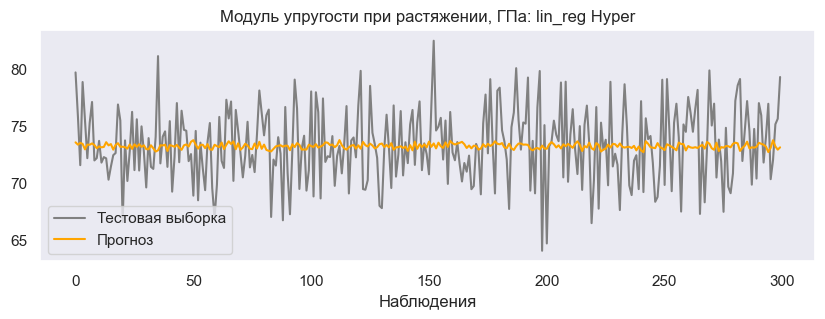

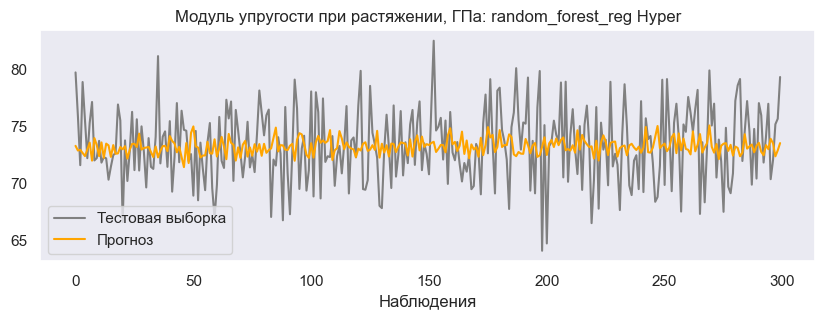

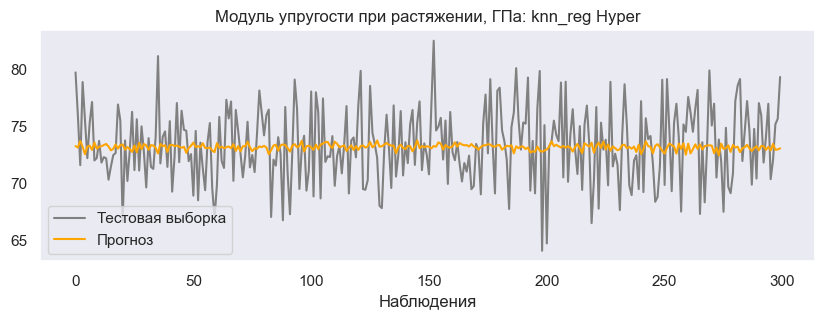

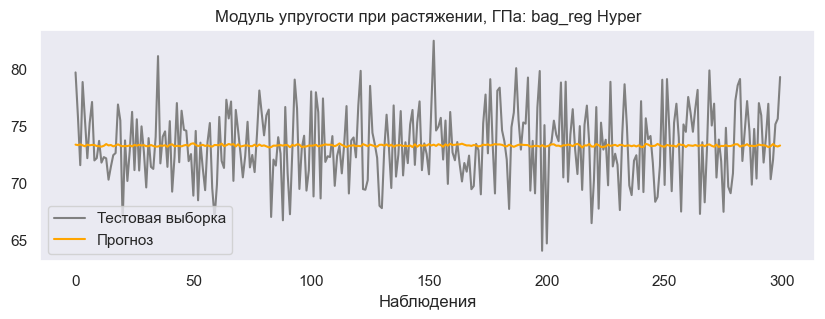

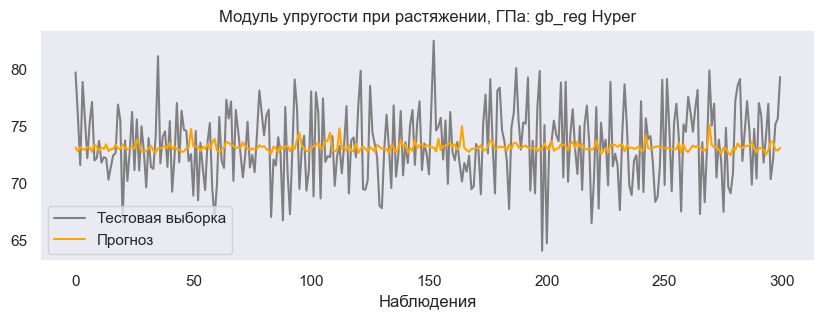

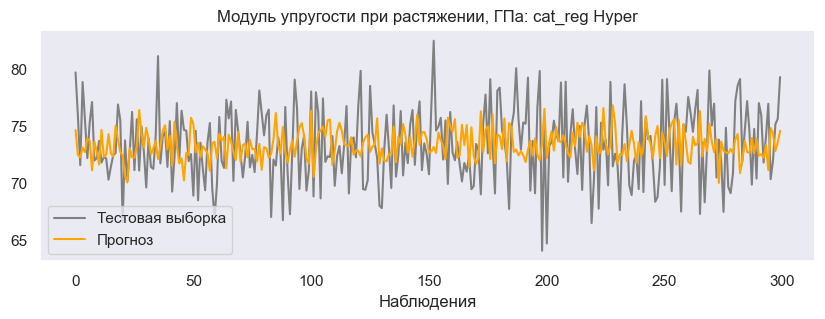

In [213]:
title_1 = 'Модуль упругости при растяжении, ГПа'

for model_name, predict in y_pred_upr_hyper.items():
    comparison_plot(y_test_upr.values, predict, title_1, f'{model_name} Hyper') 

In [214]:
best_params_proch = hyperparam(X_train_proch[cols_proch], y_train_proch, models_params)

Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели lin_reg:  {'fit_intercept': True}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели random_forest_reg:  {'criterion': 'absolute_error', 'min_samples_leaf': 3, 'min_samples_split': 8, 'n_estimators': 100}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели knn_reg:  {'algorithm': 'auto', 'leaf_size': 10, 'metric': 'cosine', 'n_neighbors': 71, 'weights': 'uniform'}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели bag_reg:  {'estimator': LinearRegression(), 'max_features': 1}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели gb_reg:  {'loss': 'absolute_error', 'max_depth': 2, 'max_features': 'log2', 'n_estimators': 90}
Learning rate set to 0.067067
0:	learn: 0.0063974	total: 9.32ms	remaining: 4.65s
499:	learn: 0.8275893	total: 2.83s	remaining: 0us
Лучшие

In [215]:
models_proch_params = {
    "lin_reg": LinearRegression(fit_intercept=True),
    "random_forest_reg": RandomForestRegressor(criterion='absolute_error',  min_samples_leaf=3, min_samples_split=8, n_estimators=100), #max_depth=50,
    "knn_reg": KNeighborsRegressor(algorithm='auto', leaf_size= 10,  metric= 'cosine',  n_neighbors=71,  weights= 'uniform'),
    "bag_reg": BaggingRegressor(estimator=LinearRegression(), max_features=1),
    "gb_reg": GradientBoostingRegressor(loss='absolute_error', max_depth=2, max_features='log2', n_estimators=90),
    "cat_reg": CatBoostRegressor(eval_metric='R2', iterations=500)
}


In [216]:
models_proch_hyper, metrics_proch_hyper, y_pred_proch_hyper, features_hyper = modeling(X_train_proch[cols_proch], X_test_proch[cols_proch], 
                                                                                 y_train_proch, y_test_proch, models=models_proch_params)
metrics_proch_hyper

Learning rate set to 0.067067
0:	learn: 0.0049843	total: 4.8ms	remaining: 2.4s
1:	learn: 0.0092266	total: 11.5ms	remaining: 2.86s
2:	learn: 0.0192614	total: 14.5ms	remaining: 2.4s
3:	learn: 0.0267864	total: 18.5ms	remaining: 2.29s
4:	learn: 0.0323113	total: 23.8ms	remaining: 2.35s
5:	learn: 0.0366297	total: 27.7ms	remaining: 2.28s
6:	learn: 0.0394380	total: 30.4ms	remaining: 2.14s
7:	learn: 0.0445260	total: 33.4ms	remaining: 2.05s
8:	learn: 0.0492283	total: 40.8ms	remaining: 2.23s
9:	learn: 0.0549171	total: 43.6ms	remaining: 2.13s
10:	learn: 0.0588761	total: 46.3ms	remaining: 2.06s
11:	learn: 0.0629592	total: 48.7ms	remaining: 1.98s
12:	learn: 0.0684471	total: 54ms	remaining: 2.02s
13:	learn: 0.0725025	total: 57.5ms	remaining: 2s
14:	learn: 0.0788847	total: 60.3ms	remaining: 1.95s
15:	learn: 0.0852856	total: 63ms	remaining: 1.91s
16:	learn: 0.0891078	total: 68.8ms	remaining: 1.95s
17:	learn: 0.0924665	total: 72.7ms	remaining: 1.95s
18:	learn: 0.0995912	total: 75.5ms	remaining: 1.91s
19

,R2_train,R2,MSE,RMSE,MAE,MAPE
lin_reg,0.01,-0.01,226330.27,475.74,371.20,0.16
random_forest_reg,0.47,-0.05,233760.26,483.49,381.08,0.16
knn_reg,0.02,-0.02,228443.29,477.96,373.72,0.16
bag_reg,0.00,-0.01,225682.18,475.06,372.67,0.16
gb_reg,0.12,-0.01,225813.63,475.20,372.61,0.16
cat_reg,0.83,-0.15,256622.95,506.58,402.34,0.17


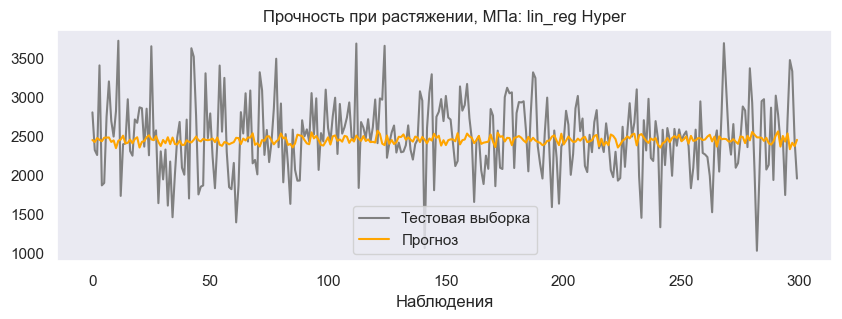

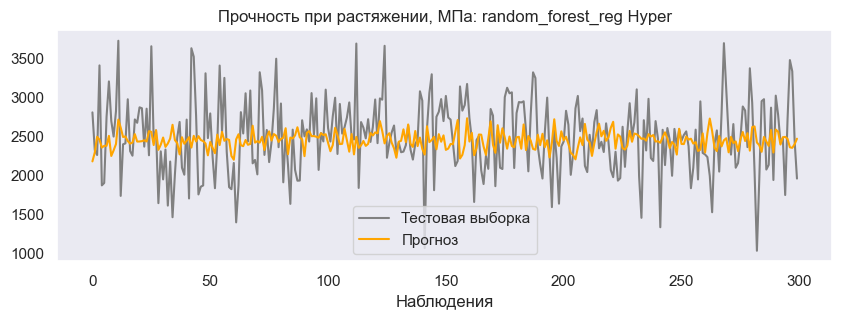

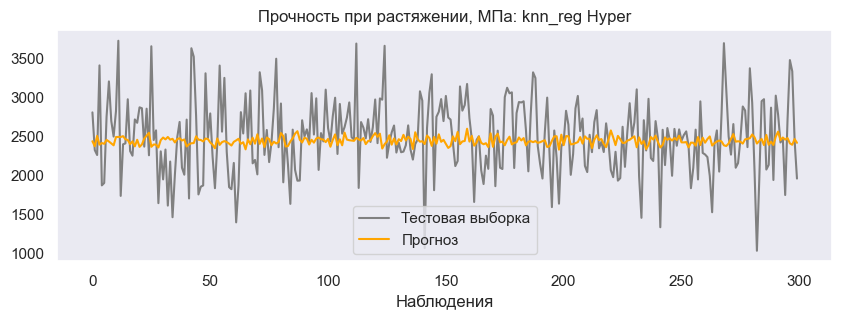

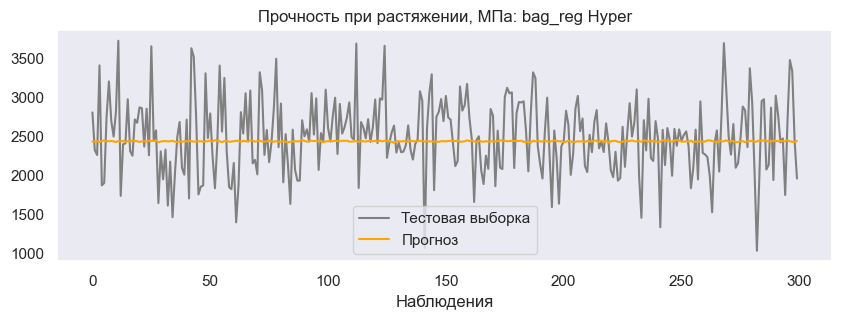

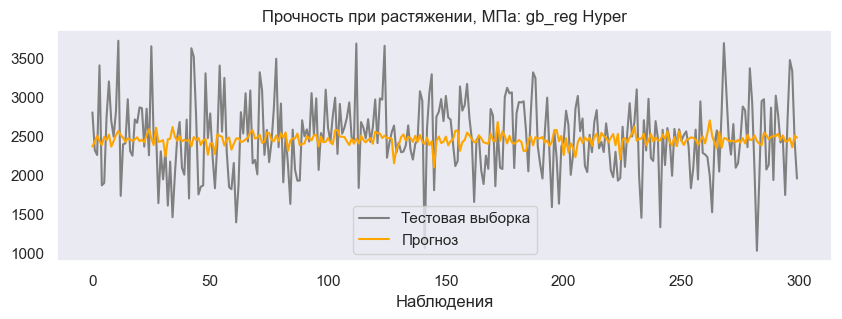

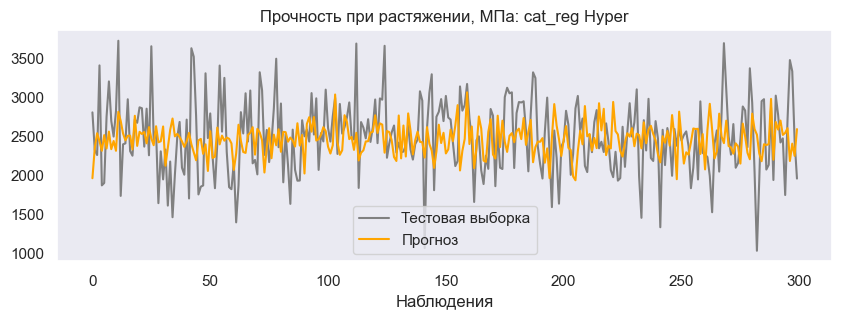

In [218]:
title_2 = 'Прочность при растяжении, МПа'

for model_name, predict in y_pred_proch_hyper.items():
    comparison_plot(y_test_proch.values, predict, title_2, f'{model_name} Hyper') 

### Проверка других моделей

In [77]:
reg_upr = LazyRegressor(verbose=0, ignore_warnings=True, custom_metric=None)
lazy_models_upr, lazy_pred_upr = reg_upr.fit(X_train_upr, X_test_upr, y_train_upr,  y_test_upr) 
lazy_models_upr

100%|██████████| 42/42 [00:10<00:00,  3.94it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2360
[LightGBM] [Info] Number of data points in the train set: 642, number of used features: 12
[LightGBM] [Info] Start training from score 73.239694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
OrthogonalMatchingPursuit,-0.04,0.00,3.25,0.01
OrthogonalMatchingPursuitCV,-0.04,0.00,3.25,0.03
HuberRegressor,-0.04,0.00,3.25,0.03
GammaRegressor,-0.04,0.00,3.25,0.47
TweedieRegressor,-0.04,0.00,3.25,0.02
LassoLarsIC,-0.04,0.00,3.25,0.02
RidgeCV,-0.04,0.00,3.26,0.02
PoissonRegressor,-0.04,0.00,3.26,0.02
Ridge,-0.04,0.00,3.26,0.02


In [78]:
reg_proch = LazyRegressor(verbose=0, ignore_warnings=True, custom_metric=None) 
lazy_models_proch, lazy_pred_proch = reg_proch.fit(X_train_proch, X_test_proch, y_train_proch,  y_test_proch) 
lazy_models_proch

  0%|          | 0/42 [00:00<?, ?it/s]

100%|██████████| 42/42 [00:09<00:00,  4.60it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2361
[LightGBM] [Info] Number of data points in the train set: 642, number of used features: 12
[LightGBM] [Info] Start training from score 2447.100037
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
BayesianRidge,-0.05,-0.01,473.79,0.02
TweedieRegressor,-0.05,-0.01,473.90,0.02
ElasticNetCV,-0.05,-0.01,473.91,0.19
GammaRegressor,-0.05,-0.01,473.98,0.01
ElasticNet,-0.05,-0.01,474.42,0.02
DummyRegressor,-0.05,-0.01,474.61,0.02
LassoCV,-0.05,-0.01,474.73,0.15
LarsCV,-0.05,-0.01,474.74,0.04
LassoLarsCV,-0.05,-0.01,474.74,0.04


## НС для рекомендации соотношения матрица-наполнитель

In [79]:
y_col = 'Соотношение матрица-наполнитель'
y_train_matrix = df_train[y_col].copy()
y_test_matrix = df_test[y_col].copy()

X_train_matrix = df_train.drop([y_col], axis=1)
X_test_matrix = df_test.drop([y_col], axis=1)

X_train_matrix.shape, X_test_matrix.shape, y_train_matrix.shape, y_test_matrix.shape

((642, 12), (300, 12), (642,), (300,))

In [80]:
#Все колонки
normalizer1 = tf.keras.layers.Normalization(axis=-1) #создание слоя
normalizer1.adapt(np.array(X_train_matrix)) #предобучение нормализатора. Аналог std

#Колонки определенные Phik
normalizer2 = tf.keras.layers.Normalization(axis=-1) 
normalizer2.adapt(np.array(X_train_matrix[X_col_matrix])) 

In [81]:
def plot_loss(history):
  plt.plot(history.history['loss'], label='Ошибка обучения', color='grey')
  plt.plot(history.history['val_loss'], label='Ошибка валидации', color='orange')
  plt.ylim([0, 5])
  plt.xlabel('Эпохи обучения')
  plt.ylabel('Ошибка прогноза')
  plt.legend()
  

In [82]:
def model_metrics(model_name:str(), y_test, y_pred):
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    
    metrics = pd.DataFrame({
            "MSE": [mse],
            "RMSE": [rmse],
            "MAE": [mae],
            "R2": [r2],
            "MAPE": [mape]}, index=[model_name])

    return metrics

##### Top 2 модели по итогам тестов. №1 - наименшая ошибка. №2 - низкая ошибка, но с попыткой предсказать значения, а не dummy regressor

10/10 [==============================] - 0s 6ms/step


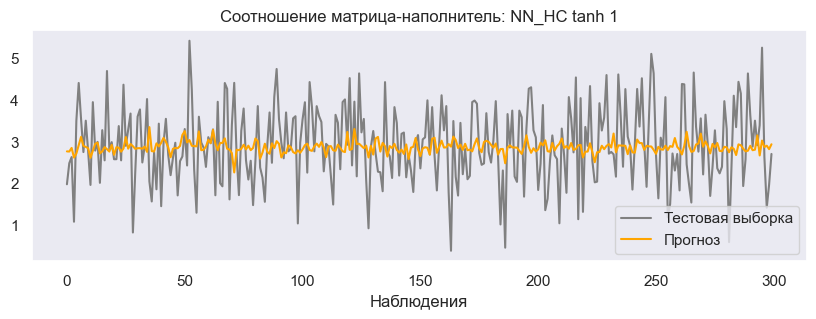

,MSE,RMSE,MAE,R2,MAPE
НС tanh 1,0.85,0.92,0.74,0.02,0.34


In [202]:
comparison_plot(y_test_matrix.values, model_dict['НС tanh 1'].predict(X_test_matrix), title='Соотношение матрица-наполнитель', model_name=f'NN_НС tanh 1')
models_nn_results['НС tanh 1']

10/10 [==============================] - 0s 3ms/step


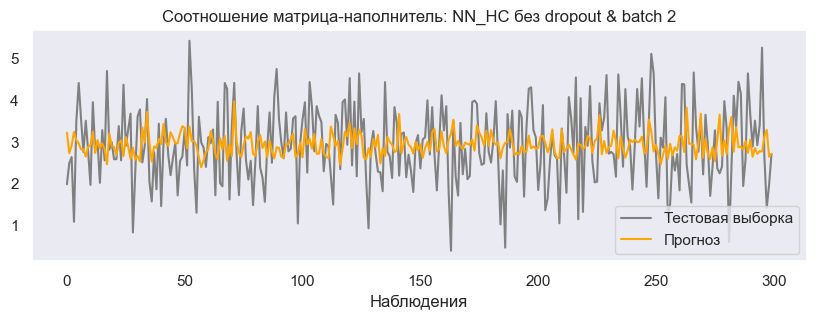

,MSE,RMSE,MAE,R2,MAPE
НС без dropout & batch 2,0.90,0.95,0.77,-0.04,0.36


In [201]:
comparison_plot(y_test_matrix.values, model_dict['НС без dropout & batch 2'].predict(X_test_matrix), title='Соотношение матрица-наполнитель', model_name=f'NN_НС без dropout & batch 2')
models_nn_results['НС без dropout & batch 2']

In [ ]:
results.sort_values(by=['R2'], ascending=False).head(50)

,MSE,RMSE,MAE,R2,MAPE
НС tanh 1,0.85,0.92,0.74,0.02,0.34
НС 10 6,0.86,0.93,0.75,0.00,0.34
НС sigmoid без Drop и Batch 3,0.86,0.93,0.75,0.00,0.35
НС 10 1,0.87,0.93,0.75,0.00,0.35
НС sigmoid без Drop и Batch 4,0.87,0.93,0.75,0.00,0.35
НС 1 1,0.87,0.93,0.75,0.00,0.35
НС 1 1,0.87,0.93,0.75,0.00,0.35
НС 10 3,0.87,0.93,0.75,0.00,0.34
НС sigmoid без Drop и Batch 5,0.87,0.93,0.75,-0.00,0.35
НС 1 3,0.87,0.93,0.75,-0.00,0.35


#### Тест кол-во признаков и активации на выходе

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              


                                                                 
 dense (Dense)               (None, 10)                130       
                                                                 
 dense_1 (Dense)             (None, 1)                 11        
                                                                 
Total params: 166
Trainable params: 141
Non-trainable params: 25
_________________________________________________________________
Epoch 1/1000
13/13 [==============================] - 1s 26ms/step - loss: 10.1150 - mse: 10.1150 - mae: 3.0065 - mape: 103.4926 - val_loss: 10.0234 - val_mse: 10.0234 - val_mae: 2.9634 - val_mape: 101.0389
Epoch 2/1000
13/13 [==============================] - 0s 5ms/step - loss: 9.4332 - mse: 9.4332 - mae: 2.8917 - mape: 99.0495 - val_loss: 9.3732 - val_mse: 9.3732 - val_mae: 2.8528 - val_mape: 96.6824
Epoch 3/1000
13/13 [==============================] - 0s 5ms/step - loss: 8.7921 - mse: 8.7921 - mae: 2.7798 - mape: 94.7284 - val_l

,MSE,RMSE,MAE,R2,MAPE
NN_1,1.04,1.02,0.83,-0.20,0.38


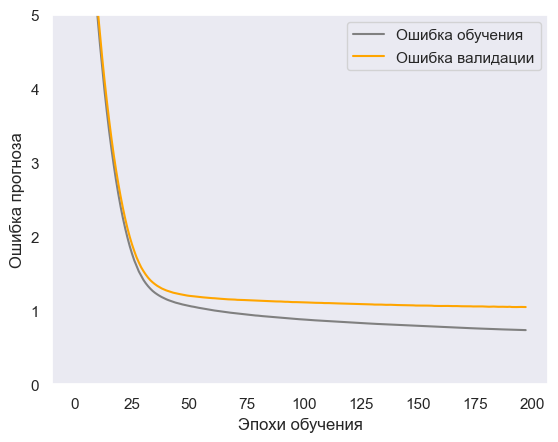

In [83]:
model = Sequential()

model.add(normalizer1)
model.add(Dense(10, activation='relu'))
model.add(Dense(1))

model.compile(optimizer=Adam(learning_rate=0.001),
              loss='mse',
              metrics=['mse', 'mae', 'mape'])

model.summary()

history = model.fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=50,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_loss', patience=5)])

plot_loss(history)
model.save(f'models/model_2active_dense')

results1 = model_metrics('NN_1', y_test_matrix, model.predict(X_test_matrix))
results1



Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_2 (Dense)             (None, 10)                60        
                                                                 
 dense_3 (Dense)             (None, 1)                 11        
                                                                 
Total params: 82
Trainable params: 71
Non-trainable params: 11
_________________________________________________________________


Epoch 1/1000
13/13 [==============================] - 1s 28ms/step - loss: 7.9701 - mse: 7.9701 - mae: 2.5987 - mape: 88.0256 - val_loss: 7.4444 - val_mse: 7.4444 - val_mae: 2.4677 - val_mape: 84.2824
Epoch 2/1000
13/13 [==============================] - 0s 7ms/step - loss: 7.3482 - mse: 7.3482 - mae: 2.4817 - mape: 83.7523 - val_loss: 6.8621 - val_mse: 6.8621 - val_mae: 2.3512 - val_mape: 79.7597
Epoch 3/1000
13/13 [==============================] - 0s 6ms/step - loss: 6.7647 - mse: 6.7647 - mae: 2.3681 - mape: 79.6816 - val_loss: 6.3227 - val_mse: 6.3227 - val_mae: 2.2368 - val_mape: 75.3442
Epoch 4/1000
13/13 [==============================] - 0s 7ms/step - loss: 6.2166 - mse: 6.2166 - mae: 2.2569 - mape: 75.7589 - val_loss: 5.8225 - val_mse: 5.8225 - val_mae: 2.1264 - val_mape: 71.3408
Epoch 5/1000
13/13 [==============================] - 0s 8ms/step - loss: 5.7141 - mse: 5.7141 - mae: 2.1494 - mape: 71.9707 - val_loss: 5.3603 - val_mse: 5.3603 - val_mae: 2.0213 - val_mape: 67.5939

,MSE,RMSE,MAE,R2,MAPE
NN_1,0.88,0.94,0.77,-0.01,0.35


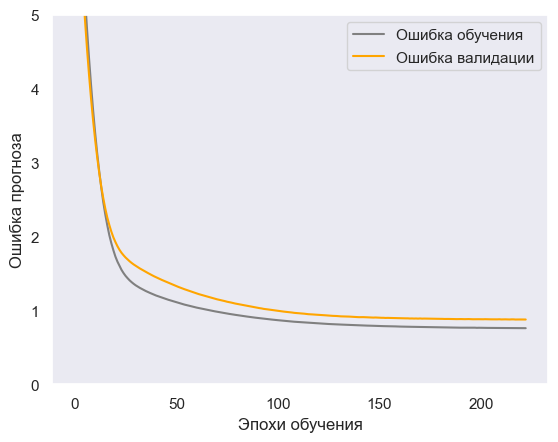

In [84]:

model_phik = Sequential()

model_phik.add(normalizer2)
model_phik.add(Dense(10, activation='relu'))
model_phik.add(Dense(1))

model_phik.compile(optimizer=Adam(learning_rate=0.001),
              loss='mse',
              metrics=['mse', 'mae', 'mape'])

model_phik.summary()

history = model_phik.fit(X_train_matrix[X_col_matrix],
                    y_train_matrix,
                    epochs=1000,
                    batch_size=50,
                    validation_split=0.2,
                    validation_data=(X_test_matrix[X_col_matrix], y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_loss', patience=5)])

plot_loss(history)
model_phik.save(f'models/model_2act_phik')

results = model_metrics('NN_1', y_test_matrix, model_phik.predict(X_test_matrix[X_col_matrix]))
results

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_4 (Dense)             (None, 10)                60        
                                                                 
 dense_5 (Dense)             (None, 1)                 11        
                                                                 
Total params: 82
Trainable params: 71
Non-trainable params: 11
_________________________________________________________________


Epoch 1/1000
13/13 [==============================] - 1s 17ms/step - loss: 6.0404 - mse: 6.0404 - mae: 2.2094 - mape: 73.3006 - val_loss: 5.3378 - val_mse: 5.3378 - val_mae: 2.0636 - val_mape: 70.1605
Epoch 2/1000
13/13 [==============================] - 0s 4ms/step - loss: 5.5742 - mse: 5.5742 - mae: 2.1037 - mape: 69.5019 - val_loss: 4.9068 - val_mse: 4.9068 - val_mae: 1.9576 - val_mape: 66.5855
Epoch 3/1000
13/13 [==============================] - 0s 4ms/step - loss: 5.1344 - mse: 5.1344 - mae: 2.0017 - mape: 65.9079 - val_loss: 4.5068 - val_mse: 4.5068 - val_mae: 1.8552 - val_mape: 63.1954
Epoch 4/1000
13/13 [==============================] - 0s 5ms/step - loss: 4.7200 - mse: 4.7200 - mae: 1.9019 - mape: 62.4013 - val_loss: 4.1412 - val_mse: 4.1412 - val_mae: 1.7609 - val_mape: 60.1455
Epoch 5/1000
13/13 [==============================] - 0s 6ms/step - loss: 4.3347 - mse: 4.3347 - mae: 1.8114 - mape: 59.3578 - val_loss: 3.8088 - val_mse: 3.8088 - val_mae: 1.6768 - val_mape: 57.5716

,MSE,RMSE,MAE,R2,MAPE
NN_1,0.90,0.95,0.77,-0.04,0.36


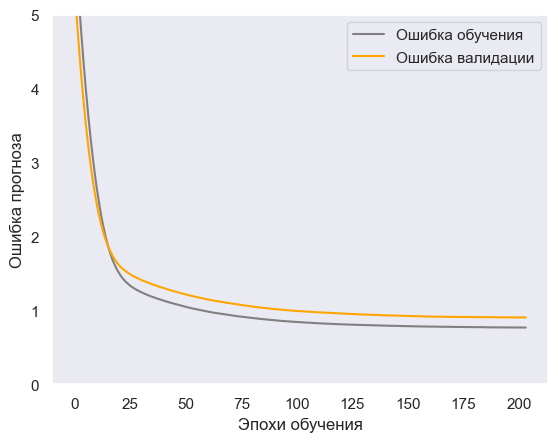

In [85]:
model_phik = Sequential()

model_phik.add(normalizer2)
model_phik.add(Dense(10, activation='relu'))
model_phik.add(Dense(1, activation='linear'))

model_phik.compile(optimizer=Adam(learning_rate=0.001),
              loss='mse',
              metrics=['mse', 'mae', 'mape'])

model_phik.summary()

history = model_phik.fit(X_train_matrix[X_col_matrix],
                    y_train_matrix,
                    epochs=1000,
                    batch_size=50,
                    validation_split=0.2,
                    validation_data=(X_test_matrix[X_col_matrix], y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_loss', patience=5)])

plot_loss(history)
model_phik.save(f'models/model_2act_phik_lin')

results = model_metrics('NN_1', y_test_matrix, model_phik.predict(X_test_matrix[X_col_matrix]))
results

Model: "sequential_141"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_623 (Dense)           (None, 1)                 6         
                                                                 
Total params: 17
Trainable params: 6
Non-trainable params: 11
_________________________________________________________________
Epoch 1/1000
13/13 [==============================] - 2s 59ms/step - loss: 11.8232 - mse: 11.8232 - mae: 2.9960 - mape: 103.8164 - val_loss: 13.2021 - val_mse: 13.2021 - val_mae: 3.1812 - val_mape: 112.4621
Epoch 2/1000
13/13 [==============================] - 0s 24ms/step - loss: 11.6720 - mse: 11.6720 - mae: 2.9802 - mape: 103.1840 - val_loss: 13.0218 - val_mse: 13.0218 - val_mae: 

,MSE,RMSE,MAE,R2,MAPE
NN_0,0.87,0.93,0.75,-0.00,0.35


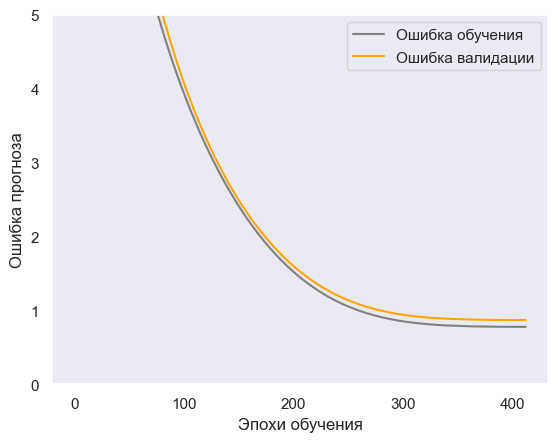

In [186]:
model_phik = Sequential()

model_phik.add(normalizer2)
model_phik.add(Dense(1))

model_phik.compile(optimizer=Adam(learning_rate=0.001),
              loss='mse',
              metrics=['mse', 'mae', 'mape'])

model_phik.summary()

history = model_phik.fit(X_train_matrix[X_col_matrix],
                    y_train_matrix,
                    epochs=1000,
                    batch_size=50,
                    validation_split=0.2,
                    validation_data=(X_test_matrix[X_col_matrix], y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_loss', patience=5)])

plot_loss(history)
model_phik.save(f'models/model_1 нейрон')

results3 = model_metrics('NN_0', y_test_matrix, model_phik.predict(X_test_matrix[X_col_matrix]))
results3

#### Тест Dropout & BatchNormalization

In [92]:
X_train_matrix = X_train_matrix[X_col_matrix]
X_test_matrix = X_test_matrix[X_col_matrix]

model_dict = {}
models_nn_results = {}
history_dict = {}
normalizer = normalizer2

dropouts = [0, 0.1, 0.2, 0.3, 0.4, 0.5]
batchs = [0, 1]
activations = ['relu','sigmoid', 'tanh']

results = pd.DataFrame(columns=["MSE", "RMSE", "MAE", "R2","MAPE"])
results

,MSE,RMSE,MAE,R2,MAPE


In [122]:
# Без BatchNoramlization и Dropout

for i in range(1, 4):
    name = f'НС без dropout & batch {i}'
    model_dict[name] = Sequential()
    model_dict[name].add(normalizer)

    for j in range(i, 0, -1):
        model_dict[name].add(Dense(10, activation='relu'))
        # model_dict[name].add(Dropout(0.3))
        # model_dict[name].add(BatchNormalization())
    
    
    model_dict[name].add(Dense(1))
    model_dict[name].compile(optimizer=Adam(learning_rate=0.001),
                        loss='mse',
                        metrics=['mse', 'mae', 'mape'])

    model_dict[name].summary()

    history = model_dict[name].fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=250,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_mse', patience=5)])

    history_dict[name] = history
    models_nn_results[name] = model_metrics(f'{name}', y_test_matrix, model_dict[name].predict(X_test_matrix))
    results = pd.concat([results, models_nn_results[name]]) 
    print(models_nn_results[name])

    model_dict[name].save(f'models/model_{name}')

models_nn_results 

Model: "sequential_75"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_341 (Dense)           (None, 10)                60        
                                                                 
 dense_342 (Dense)           (None, 1)                 11        
                                                                 
Total params: 82
Trainable params: 71
Non-trainable params: 11
_________________________________________________________________


Epoch 1/1000
3/3 [==============================] - 3s 406ms/step - loss: 12.9251 - mse: 12.9251 - mae: 3.4097 - mape: 118.3696 - val_loss: 12.9963 - val_mse: 12.9963 - val_mae: 3.4012 - val_mape: 118.8002
Epoch 2/1000
3/3 [==============================] - 0s 86ms/step - loss: 12.7509 - mse: 12.7509 - mae: 3.3860 - mape: 117.4720 - val_loss: 12.8169 - val_mse: 12.8169 - val_mae: 3.3773 - val_mape: 117.8495
Epoch 3/1000
3/3 [==============================] - 0s 63ms/step - loss: 12.5786 - mse: 12.5786 - mae: 3.3625 - mape: 116.5670 - val_loss: 12.6403 - val_mse: 12.6403 - val_mae: 3.3535 - val_mape: 116.9068
Epoch 4/1000
3/3 [==============================] - 0s 36ms/step - loss: 12.4121 - mse: 12.4121 - mae: 3.3395 - mape: 115.6870 - val_loss: 12.4663 - val_mse: 12.4663 - val_mae: 3.3299 - val_mape: 115.9681
Epoch 5/1000
3/3 [==============================] - 0s 35ms/step - loss: 12.2456 - mse: 12.2456 - mae: 3.3163 - mape: 114.8040 - val_loss: 12.2952 - val_mse: 12.2952 - val_mae: 3.

{'НС без dropout & batch':                         MSE  RMSE  MAE    R2  MAPE
 НС без dropout & batch 0.92  0.96 0.78 -0.06  0.36,
 'НС без batch':                 MSE  RMSE  MAE    R2  MAPE
 НС без batch_3 1.22  1.10 0.89 -0.41  0.34,
 'НС c drop & batch':                      MSE  RMSE  MAE    R2  MAPE
 НС c drop & batch_3 0.89  0.95 0.76 -0.03  0.36,
 'НС 10x':           MSE  RMSE  MAE    R2  MAPE
 НС 10x_9 0.87  0.93 0.75 -0.00  0.34,
 'НС 10':          MSE  RMSE  MAE    R2  MAPE
 НС 10_9 0.87  0.93 0.75 -0.00  0.34,
 'НС sigmoid':               MSE  RMSE  MAE    R2  MAPE
 НС sigmoid_5 0.88  0.94 0.75 -0.01  0.34,
 'НС tanh':            MSE  RMSE  MAE    R2  MAPE
 НС tanh_5 0.88  0.94 0.75 -0.02  0.34,
 'НС без dropout & batch 1':                           MSE  RMSE  MAE    R2  MAPE
 НС без dropout & batch 1 0.90  0.95 0.78 -0.04  0.35,
 'НС без dropout & batch 2':                           MSE  RMSE  MAE    R2  MAPE
 НС без dropout & batch 2 0.90  0.95 0.77 -0.04  0.36,
 'НС без d

In [123]:
# Без BatchNoramlization

for i in range(1, 4):
    name = f'НС без batch {i}'
    model_dict[name] = Sequential()
    model_dict[name].add(normalizer)

    for j in range(i, 0, -1):
        model_dict[name].add(Dense(10, activation='relu'))
        model_dict[name].add(Dropout(0.3))
        # model_dict[name].add(BatchNormalization())
    
    
    model_dict[name].add(Dense(1))
    model_dict[name].compile(optimizer=Adam(learning_rate=0.001),
                        loss='mse',
                        metrics=['mse', 'mae', 'mape'])

    model_dict[name].summary()

    history = model_dict[name].fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=250,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_mse', patience=5)])

    history_dict[name] = history
    models_nn_results[name] = model_metrics(f'{name}', y_test_matrix, model_dict[name].predict(X_test_matrix))
    results = pd.concat([results, models_nn_results[name]]) 
    print(models_nn_results[name])

    model_dict[name].save(f'models/model_{name}')

Model: "sequential_78"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_350 (Dense)           (None, 10)                60        
                                                                 
 dropout_249 (Dropout)       (None, 10)                0         
                                                                 
 dense_351 (Dense)           (None, 1)                 11        
                                                                 
Total params: 82
Trainable params: 71
Non-trainable params: 11
_________________________________________________________________
Epoch 1/1000
3/3 [==============================] - 1s 120ms/step - loss: 4.8060 - mse: 4.8060 - mae: 1.9239 - mape: 63.73

3/3 [==============================] - 0s 26ms/step - loss: 2.3195 - mse: 2.3195 - mae: 1.2177 - mape: 44.2620 - val_loss: 1.6155 - val_mse: 1.6155 - val_mae: 1.0151 - val_mape: 39.6064
Epoch 83/1000
3/3 [==============================] - 0s 24ms/step - loss: 2.1952 - mse: 2.1952 - mae: 1.2008 - mape: 44.2044 - val_loss: 1.6082 - val_mse: 1.6082 - val_mae: 1.0124 - val_mape: 39.5662
Epoch 84/1000
3/3 [==============================] - 0s 31ms/step - loss: 2.1708 - mse: 2.1708 - mae: 1.1842 - mape: 43.5774 - val_loss: 1.6012 - val_mse: 1.6012 - val_mae: 1.0097 - val_mape: 39.5177
Epoch 85/1000
3/3 [==============================] - 0s 26ms/step - loss: 2.2057 - mse: 2.2057 - mae: 1.1990 - mape: 44.4184 - val_loss: 1.5953 - val_mse: 1.5953 - val_mae: 1.0074 - val_mape: 39.4670
Epoch 86/1000
3/3 [==============================] - 0s 19ms/step - loss: 2.1129 - mse: 2.1129 - mae: 1.1603 - mape: 42.3911 - val_loss: 1.5889 - val_mse: 1.5889 - val_mae: 1.0050 - val_mape: 39.4157
Epoch 87/1000


In [165]:
for i in range(1, 4):
    name = f'НС c drop & batch {i}'
    model_dict[name] = Sequential()
    model_dict[name].add(normalizer)

    for j in range(i, 0, -1):
        model_dict[name].add(Dense(10, activation='relu'))
        model_dict[name].add(Dropout(0.3))
        model_dict[name].add(BatchNormalization())
    
    
    model_dict[name].add(Dense(1))
    model_dict[name].compile(optimizer=Adam(learning_rate=0.001),
                        loss='mse',
                        metrics=['mse', 'mae', 'mape'])

    model_dict[name].summary()

    history = model_dict[name].fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=250,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_mse', patience=5)])

    history_dict[name] = history
    models_nn_results[name] = model_metrics(f'{name}', y_test_matrix, model_dict[name].predict(X_test_matrix))
    results = pd.concat([results, models_nn_results[name]]) 
    print(models_nn_results[name])

    model_dict[name].save(f'models/model_{name}')

Model: "sequential_118"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_534 (Dense)           (None, 10)                60        
                                                                 
 dropout_393 (Dropout)       (None, 10)                0         
                                                                 
 batch_normalization_375 (Ba  (None, 10)               40        
 tchNormalization)                                               
                                                                 
 dense_535 (Dense)           (None, 1)                 11        
                                                                 
Total params: 122
Trainable params: 91
Non-trainable

Epoch 1/1000
3/3 [==============================] - 3s 444ms/step - loss: 11.5685 - mse: 11.5685 - mae: 3.0372 - mape: 106.1098 - val_loss: 5.0771 - val_mse: 5.0771 - val_mae: 1.9684 - val_mape: 66.7689
Epoch 2/1000
3/3 [==============================] - 0s 59ms/step - loss: 11.3021 - mse: 11.3021 - mae: 3.0124 - mape: 104.5900 - val_loss: 5.1090 - val_mse: 5.1090 - val_mae: 1.9773 - val_mape: 67.0036
Epoch 3/1000
3/3 [==============================] - 0s 58ms/step - loss: 11.1674 - mse: 11.1674 - mae: 2.9923 - mape: 103.5933 - val_loss: 5.1423 - val_mse: 5.1423 - val_mae: 1.9864 - val_mape: 67.2499
Epoch 4/1000
3/3 [==============================] - 0s 83ms/step - loss: 11.1907 - mse: 11.1907 - mae: 3.0097 - mape: 104.5611 - val_loss: 5.1701 - val_mse: 5.1701 - val_mae: 1.9943 - val_mape: 67.4570
Epoch 5/1000
3/3 [==============================] - 0s 76ms/step - loss: 10.7285 - mse: 10.7285 - mae: 2.9523 - mape: 102.6110 - val_loss: 5.1924 - val_mse: 5.1924 - val_mae: 2.0008 - val_map

In [166]:
results

,MSE,RMSE,MAE,R2,MAPE
НС без dropout & batch 1,0.90,0.95,0.78,-0.04,0.35
НС без dropout & batch 2,0.90,0.95,0.77,-0.04,0.36
НС без dropout & batch 3,0.92,0.96,0.77,-0.06,0.36
НС без batch 1,0.90,0.95,0.76,-0.03,0.33
НС без batch 2,1.13,1.06,0.85,-0.31,0.34
НС без batch 3,1.43,1.19,0.95,-0.64,0.35
НС 10 1,0.87,0.93,0.75,0.00,0.35
НС 10 2,0.88,0.94,0.76,-0.02,0.36
НС 10 3,0.87,0.93,0.75,0.00,0.34
НС 10 4,0.89,0.94,0.76,-0.02,0.34


#### Тест на увеличение кол-ва нейронов

In [126]:

for i in range(1, 10):
    name = f'НС 10 {i}'
    model_dict[name] = Sequential()
    model_dict[name].add(normalizer)

    for j in range(i, 0, -1):
        model_dict[name].add(Dense(10, activation='relu'))
        model_dict[name].add(Dropout(0.3))
        model_dict[name].add(BatchNormalization())
    
    
    model_dict[name].add(Dense(1))
    model_dict[name].compile(optimizer=Adam(learning_rate=0.001),
                        loss='mse',
                        metrics=['mse', 'mae', 'mape'])

    model_dict[name].summary()

    history = model_dict[name].fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=250,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_mse', patience=5)])

    history_dict[name] = history
    models_nn_results[name] = model_metrics(f'{name}', y_test_matrix, model_dict[name].predict(X_test_matrix))
    results = pd.concat([results, models_nn_results[name]]) 
    print(models_nn_results[name])

    model_dict[name].save(f'models/model_{name}')

Model: "sequential_84"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_368 (Dense)           (None, 10)                60        
                                                                 
 dropout_261 (Dropout)       (None, 10)                0         
                                                                 
 batch_normalization_243 (Ba  (None, 10)               40        
 tchNormalization)                                               
                                                                 
 dense_369 (Dense)           (None, 1)                 11        
                                                                 
Total params: 122
Trainable params: 91
Non-trainable 

3/3 [==============================] - 1s 141ms/step - loss: 10.1254 - mse: 10.1254 - mae: 2.9336 - mape: 100.9767 - val_loss: 10.5946 - val_mse: 10.5946 - val_mae: 3.0829 - val_mape: 107.5745
Epoch 2/1000
3/3 [==============================] - 0s 19ms/step - loss: 10.0643 - mse: 10.0643 - mae: 2.9277 - mape: 100.2370 - val_loss: 10.4740 - val_mse: 10.4740 - val_mae: 3.0643 - val_mape: 106.8066
Epoch 3/1000
3/3 [==============================] - 0s 19ms/step - loss: 9.9037 - mse: 9.9037 - mae: 2.9064 - mape: 99.3262 - val_loss: 10.3604 - val_mse: 10.3604 - val_mae: 3.0468 - val_mape: 106.0810
Epoch 4/1000
3/3 [==============================] - 0s 17ms/step - loss: 9.8144 - mse: 9.8144 - mae: 2.8991 - mape: 99.3785 - val_loss: 10.2535 - val_mse: 10.2535 - val_mae: 3.0303 - val_mape: 105.3967
Epoch 5/1000
3/3 [==============================] - 0s 24ms/step - loss: 9.7662 - mse: 9.7662 - mae: 2.8978 - mape: 99.0893 - val_loss: 10.1532 - val_mse: 10.1532 - val_mae: 3.0147 - val_mape: 104.7

In [127]:

for i in range(1, 10):
    name = f'НС 10x {i}'
    model_dict[name] = Sequential()
    model_dict[name].add(normalizer)

    for j in range(i, 0, -1):
        model_dict[name].add(Dense(10*j, activation='relu'))
        model_dict[name].add(Dropout(0.3))
        model_dict[name].add(BatchNormalization())
    
    
    model_dict[name].add(Dense(1))
    model_dict[name].compile(optimizer=Adam(learning_rate=0.001),
                        loss='mse',
                        metrics=['mse', 'mae', 'mape'])

    model_dict[name].summary()

    history = model_dict[name].fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=250,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_mse', patience=5)])

    history_dict[name] = history
    models_nn_results[name] = model_metrics(f'{name}', y_test_matrix, model_dict[name].predict(X_test_matrix))
    results = pd.concat([results, models_nn_results[name]]) 
    print(models_nn_results[name])

    model_dict[name].save(f'models/model_{name}')

Model: "sequential_93"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_422 (Dense)           (None, 10)                60        
                                                                 
 dropout_306 (Dropout)       (None, 10)                0         
                                                                 
 batch_normalization_288 (Ba  (None, 10)               40        
 tchNormalization)                                               
                                                                 
 dense_423 (Dense)           (None, 1)                 11        
                                                                 
Total params: 122
Trainable params: 91
Non-trainable 

3/3 [==============================] - 2s 192ms/step - loss: 11.2182 - mse: 11.2182 - mae: 2.9524 - mape: 101.2682 - val_loss: 11.5596 - val_mse: 11.5596 - val_mae: 3.2559 - val_mape: 113.3843
Epoch 2/1000
3/3 [==============================] - 0s 20ms/step - loss: 10.8919 - mse: 10.8919 - mae: 2.9306 - mape: 101.2396 - val_loss: 11.3584 - val_mse: 11.3584 - val_mae: 3.2257 - val_mape: 112.1268
Epoch 3/1000
3/3 [==============================] - 0s 19ms/step - loss: 10.7428 - mse: 10.7428 - mae: 2.9212 - mape: 101.0514 - val_loss: 11.1698 - val_mse: 11.1698 - val_mae: 3.1971 - val_mape: 110.9384
Epoch 4/1000
3/3 [==============================] - 0s 19ms/step - loss: 10.6350 - mse: 10.6350 - mae: 2.9163 - mape: 100.7328 - val_loss: 10.9652 - val_mse: 10.9652 - val_mae: 3.1658 - val_mape: 109.6540
Epoch 5/1000
3/3 [==============================] - 0s 20ms/step - loss: 10.4248 - mse: 10.4248 - mae: 2.9061 - mape: 100.5682 - val_loss: 10.7815 - val_mse: 10.7815 - val_mae: 3.1374 - val_ma

In [168]:
results[6:24]

,MSE,RMSE,MAE,R2,MAPE
НС 10 1,0.87,0.93,0.75,0.00,0.35
НС 10 2,0.88,0.94,0.76,-0.02,0.36
НС 10 3,0.87,0.93,0.75,0.00,0.34
НС 10 4,0.89,0.94,0.76,-0.02,0.34
НС 10 5,0.89,0.94,0.76,-0.02,0.34
НС 10 6,0.86,0.93,0.75,0.00,0.34
НС 10 7,0.89,0.94,0.76,-0.03,0.33
НС 10 8,0.87,0.93,0.75,-0.00,0.34
НС 10 9,0.91,0.95,0.76,-0.05,0.33
НС 10x 1,0.87,0.93,0.75,-0.00,0.35


In [189]:
for i in range(1, 5):
    name = f'НС 1 {i}'
    model_dict[name] = Sequential()
    model_dict[name].add(normalizer)

    for j in range(i, 0, -1):
        model_dict[name].add(Dense(1, activation='tanh'))
        model_dict[name].add(Dropout(0.3))
        model_dict[name].add(BatchNormalization())
    
    
    model_dict[name].add(Dense(1))
    model_dict[name].compile(optimizer=Adam(learning_rate=0.001),
                        loss='mse',
                        metrics=['mse', 'mae', 'mape'])

    model_dict[name].summary()

    history = model_dict[name].fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=250,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_mse', patience=5)])

    history_dict[name] = history
    models_nn_results[name] = model_metrics(f'{name}', y_test_matrix, model_dict[name].predict(X_test_matrix))
    results = pd.concat([results, models_nn_results[name]]) 
    print(models_nn_results[name])

    model_dict[name].save(f'models/model_{name}')

Model: "sequential_142"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_624 (Dense)           (None, 1)                 6         
                                                                 
 dropout_414 (Dropout)       (None, 1)                 0         
                                                                 
 batch_normalization_381 (Ba  (None, 1)                4         
 tchNormalization)                                               
                                                                 
 dense_625 (Dense)           (None, 1)                 2         
                                                                 
Total params: 23
Trainable params: 10
Non-trainable 

#### Тест на функцию активации

In [130]:

for i in range(1, 6):
    name = f'НС sigmoid {i}'
    model_dict[name] = Sequential()
    model_dict[name].add(normalizer)

    for j in range(i, 0, -1):
        model_dict[name].add(Dense(10, activation='sigmoid'))
        model_dict[name].add(Dropout(0.3))
        model_dict[name].add(BatchNormalization())
    
    
    model_dict[name].add(Dense(1))
    model_dict[name].compile(optimizer=Adam(learning_rate=0.001),
                        loss='mse',
                        metrics=['mse', 'mae', 'mape'])

    model_dict[name].summary()

    history = model_dict[name].fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=250,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_mse', patience=5)])

    history_dict[name] = history
    models_nn_results[name] = model_metrics(f'{name}', y_test_matrix, model_dict[name].predict(X_test_matrix))
    results = pd.concat([results, models_nn_results[name]]) 
    print(models_nn_results[name])

    model_dict[name].save(f'models/model_{name}')

Model: "sequential_102"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_476 (Dense)           (None, 10)                60        
                                                                 
 dropout_351 (Dropout)       (None, 10)                0         
                                                                 
 batch_normalization_333 (Ba  (None, 10)               40        
 tchNormalization)                                               
                                                                 
 dense_477 (Dense)           (None, 1)                 11        
                                                                 
Total params: 122
Trainable params: 91
Non-trainable

3/3 [==============================] - 1s 205ms/step - loss: 10.7787 - mse: 10.7787 - mae: 2.9420 - mape: 101.8637 - val_loss: 4.8221 - val_mse: 4.8221 - val_mae: 1.9883 - val_mape: 64.9168
Epoch 2/1000
3/3 [==============================] - 0s 24ms/step - loss: 10.8881 - mse: 10.8881 - mae: 2.9460 - mape: 100.5591 - val_loss: 4.8756 - val_mse: 4.8756 - val_mae: 2.0015 - val_mape: 65.3692
Epoch 3/1000
3/3 [==============================] - 0s 23ms/step - loss: 10.5458 - mse: 10.5458 - mae: 2.9266 - mape: 100.7445 - val_loss: 4.9268 - val_mse: 4.9268 - val_mae: 2.0141 - val_mape: 65.7987
Epoch 4/1000
3/3 [==============================] - 0s 26ms/step - loss: 10.4109 - mse: 10.4109 - mae: 2.9011 - mape: 99.8905 - val_loss: 4.9698 - val_mse: 4.9698 - val_mae: 2.0247 - val_mape: 66.1577
Epoch 5/1000
3/3 [==============================] - 0s 20ms/step - loss: 10.3992 - mse: 10.3992 - mae: 2.8984 - mape: 100.4391 - val_loss: 5.0129 - val_mse: 5.0129 - val_mae: 2.0351 - val_mape: 66.5141
Epo

In [174]:
for i in range(1, 6):
    name = f'НС sigmoid без Drop и Batch {i}'
    model_dict[name] = Sequential()
    model_dict[name].add(normalizer)

    for j in range(i, 0, -1):
        model_dict[name].add(Dense(10, activation='sigmoid'))
        # model_dict[name].add(Dropout(0.3))
        # model_dict[name].add(BatchNormalization())
    
    
    model_dict[name].add(Dense(1))
    model_dict[name].compile(optimizer=Adam(learning_rate=0.001),
                        loss='mse',
                        metrics=['mse', 'mae', 'mape'])

    model_dict[name].summary()

    history = model_dict[name].fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=250,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_mse', patience=5)])

    history_dict[name] = history
    models_nn_results[name] = model_metrics(f'{name}', y_test_matrix, model_dict[name].predict(X_test_matrix))
    results = pd.concat([results, models_nn_results[name]]) 
    print(models_nn_results[name])

    model_dict[name].save(f'models/model_{name}')

Model: "sequential_121"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_543 (Dense)           (None, 10)                60        
                                                                 
 dense_544 (Dense)           (None, 1)                 11        
                                                                 
Total params: 82
Trainable params: 71
Non-trainable params: 11
_________________________________________________________________
Epoch 1/1000
3/3 [==============================] - 3s 463ms/step - loss: 9.4835 - mse: 9.4835 - mae: 2.9451 - mape: 100.6403 - val_loss: 9.4210 - val_mse: 9.4210 - val_mae: 2.9226 - val_mape: 99.7247
Epoch 2/1000
3/3 [==============================] - 

In [178]:
for i in range(1, 6):
    name = f'НС sigmoid без Batch {i}'
    model_dict[name] = Sequential()
    model_dict[name].add(normalizer)

    for j in range(i, 0, -1):
        model_dict[name].add(Dense(10, activation='sigmoid'))
        model_dict[name].add(Dropout(0.3))
        # model_dict[name].add(BatchNormalization())
    
    
    model_dict[name].add(Dense(1))
    model_dict[name].compile(optimizer=Adam(learning_rate=0.001),
                        loss='mse',
                        metrics=['mse', 'mae', 'mape'])

    model_dict[name].summary()

    history = model_dict[name].fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=250,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_mse', patience=5)])

    history_dict[name] = history
    models_nn_results[name] = model_metrics(f'{name}', y_test_matrix, model_dict[name].predict(X_test_matrix))
    results = pd.concat([results, models_nn_results[name]]) 
    print(models_nn_results[name])

    model_dict[name].save(f'models/model_{name}')

Model: "sequential_131"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_583 (Dense)           (None, 10)                60        
                                                                 
 dropout_399 (Dropout)       (None, 10)                0         
                                                                 
 dense_584 (Dense)           (None, 1)                 11        
                                                                 
Total params: 82
Trainable params: 71
Non-trainable params: 11
_________________________________________________________________
Epoch 1/1000
3/3 [==============================] - 3s 411ms/step - loss: 8.1211 - mse: 8.1211 - mae: 2.6731 - mape: 89.9

In [131]:

for i in range(1, 6):
    name = f'НС tanh {i}'
    model_dict[name] = Sequential()
    model_dict[name].add(normalizer)

    for j in range(i, 0, -1):
        model_dict[name].add(Dense(10, activation='tanh'))
        model_dict[name].add(Dropout(0.3))
        model_dict[name].add(BatchNormalization())
    
    
    model_dict[name].add(Dense(1))
    model_dict[name].compile(optimizer=Adam(learning_rate=0.001),
                        loss='mse',
                        metrics=['mse', 'mae', 'mape'])

    model_dict[name].summary()

    history = model_dict[name].fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=250,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_mse', patience=5)])

    history_dict[name] = history
    models_nn_results[name] = model_metrics(f'{name}', y_test_matrix, model_dict[name].predict(X_test_matrix))
    results = pd.concat([results, models_nn_results[name]]) 
    print(models_nn_results[name])

    model_dict[name].save(f'models/model_{name}')

Model: "sequential_107"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_496 (Dense)           (None, 10)                60        
                                                                 
 dropout_366 (Dropout)       (None, 10)                0         
                                                                 
 batch_normalization_348 (Ba  (None, 10)               40        
 tchNormalization)                                               
                                                                 
 dense_497 (Dense)           (None, 1)                 11        
                                                                 
Total params: 122
Trainable params: 91
Non-trainable

3/3 [==============================] - 2s 351ms/step - loss: 10.8016 - mse: 10.8016 - mae: 2.9592 - mape: 102.5993 - val_loss: 9.4276 - val_mse: 9.4276 - val_mae: 2.8868 - val_mape: 99.8208
Epoch 2/1000
3/3 [==============================] - 0s 29ms/step - loss: 10.8089 - mse: 10.8089 - mae: 2.9447 - mape: 101.9589 - val_loss: 9.3129 - val_mse: 9.3129 - val_mae: 2.8697 - val_mape: 99.1111
Epoch 3/1000
3/3 [==============================] - 0s 21ms/step - loss: 10.5151 - mse: 10.5151 - mae: 2.9226 - mape: 100.5789 - val_loss: 9.2028 - val_mse: 9.2028 - val_mae: 2.8532 - val_mape: 98.4257
Epoch 4/1000
3/3 [==============================] - 0s 21ms/step - loss: 10.3238 - mse: 10.3238 - mae: 2.9018 - mape: 99.9777 - val_loss: 9.0940 - val_mse: 9.0940 - val_mae: 2.8367 - val_mape: 97.7389
Epoch 5/1000
3/3 [==============================] - 0s 20ms/step - loss: 10.1482 - mse: 10.1482 - mae: 2.8789 - mape: 99.3665 - val_loss: 8.9959 - val_mse: 8.9959 - val_mae: 2.8219 - val_mape: 97.1170
Epoc

In [175]:
for i in range(1, 6):
    name = f'НС tanh без Drop и Batch {i}'
    model_dict[name] = Sequential()
    model_dict[name].add(normalizer)

    for j in range(i, 0, -1):
        model_dict[name].add(Dense(10, activation='tanh'))
        # model_dict[name].add(Dropout(0.3))
        # model_dict[name].add(BatchNormalization())
    
    
    model_dict[name].add(Dense(1))
    model_dict[name].compile(optimizer=Adam(learning_rate=0.001),
                        loss='mse',
                        metrics=['mse', 'mae', 'mape'])

    model_dict[name].summary()

    history = model_dict[name].fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=250,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_mse', patience=5)])

    history_dict[name] = history
    models_nn_results[name] = model_metrics(f'{name}', y_test_matrix, model_dict[name].predict(X_test_matrix))
    results = pd.concat([results, models_nn_results[name]]) 
    print(models_nn_results[name])

    model_dict[name].save(f'models/model_{name}')

Model: "sequential_126"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_563 (Dense)           (None, 10)                60        
                                                                 
 dense_564 (Dense)           (None, 1)                 11        
                                                                 
Total params: 82
Trainable params: 71
Non-trainable params: 11
_________________________________________________________________
Epoch 1/1000
3/3 [==============================] - 2s 259ms/step - loss: 9.9561 - mse: 9.9561 - mae: 2.9252 - mape: 100.4009 - val_loss: 10.4071 - val_mse: 10.4071 - val_mae: 2.9935 - val_mape: 103.3345
Epoch 2/1000
3/3 [==============================]

In [181]:
for i in range(1, 6):
    name = f'НС tanh без Batch {i}'
    model_dict[name] = Sequential()
    model_dict[name].add(normalizer)

    for j in range(i, 0, -1):
        model_dict[name].add(Dense(10, activation='tanh'))
        # model_dict[name].add(Dropout(0.3))
        # model_dict[name].add(BatchNormalization())
    
    
    model_dict[name].add(Dense(1))
    model_dict[name].compile(optimizer=Adam(learning_rate=0.001),
                        loss='mse',
                        metrics=['mse', 'mae', 'mape'])

    model_dict[name].summary()

    history = model_dict[name].fit(X_train_matrix,
                    y_train_matrix,
                    epochs=1000,
                    batch_size=250,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_mse', patience=5)])

    history_dict[name] = history
    models_nn_results[name] = model_metrics(f'{name}', y_test_matrix, model_dict[name].predict(X_test_matrix))
    results = pd.concat([results, models_nn_results[name]]) 
    print(models_nn_results[name])

    model_dict[name].save(f'models/model_{name}')

Model: "sequential_136"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 5)                11        
 ion)                                                            
                                                                 
 dense_603 (Dense)           (None, 10)                60        
                                                                 
 dense_604 (Dense)           (None, 1)                 11        
                                                                 
Total params: 82
Trainable params: 71
Non-trainable params: 11
_________________________________________________________________
Epoch 1/1000
3/3 [==============================] - 3s 459ms/step - loss: 9.7757 - mse: 9.7757 - mae: 2.9235 - mape: 99.8137 - val_loss: 10.0218 - val_mse: 10.0218 - val_mae: 2.9596 - val_mape: 101.6596
Epoch 2/1000
3/3 [==============================] 

#### Визуализация результатов прогноза

In [ ]:
for m in model_dict.keys():
    comparison_plot(y_test_matrix.values, model_dict[m].predict(X_test_matrix), title='Соотношение матрица-наполнитель', model_name=f'NN_{m}')
    print(models_nn_results[m])

In [220]:
# модель для всех признаков
X_test_matrix_12 = df_test.drop([y_col], axis=1)
model_path = 'app/VKR_Flask/my_model'
model_restored = tf.keras.models.load_model(model_path)
model_restored.summary()
loss, rmse = model_restored.evaluate(X_test_matrix_12, y_test_matrix, verbose=2)
print('Restored model, RMSE: {:5.2f}%'.format(100 * rmse))

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 12)               25        
 ion)                                                            
                                                                 
 dense_9 (Dense)             (None, 10)                130       
                                                                 
 dropout_3 (Dropout)         (None, 10)                0         
                                                                 
 dense_10 (Dense)            (None, 10)                110       
                                                                 
 dense_11 (Dense)            (None, 1)                 11        
                                                                 
Total params: 276
Trainable params: 251
Non-trainable params: 25
_______________________________________________________